<div align="center"><img src="https://drive.google.com/uc?export=download&id=1RHAO53B5qNbHqrWObI7623jtlLZBWD73" width="300" alt="NOVA IMS Logo">

  <br>
  <br>
  <b>Master in Data Science and Advanced Analytics</b>

  <b>Deep Learning</b>

  2025–2026
</div>

<b><h1> Skin Lesions </h1><b>

<table>
  <thead style="color:#96d9f0;">
    <tr>
      <th>Name</th>
      <th>Student ID</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>Bruna Caetano</td>
      <td>20250526</td>
    </tr>
    <tr>
      <td>Fausto Gomez</td>
      <td>20221915</td>
    </tr>
    <tr>
      <td>Francisco Graça</td>
      <td>20250471</td>
    </tr>
    <tr>
      <td>Maria Francisca Gonçalves</td>
      <td>20221942</td>
    </tr>
    <tr>
      <td>Tomás Gonçalves</td>
      <td>20221894</td>
    </tr>
  </tbody>
</table>

# **0. Set-Up**

In [8]:
# pip install torch
# !pip install torchvision
# !pip install cleanvision
# !pip install opencv-python
# !pip install missingno

In [9]:
#Libraries
import os
import math
from pathlib import Path
import pandas as pd
import numpy as np
from tqdm import tqdm
import json

import seaborn as sns
import random
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as ss

import torch
import torchvision.transforms as T
import torchvision.models as models
from tqdm import tqdm
from collections import Counter
#import umap
from PIL import Image, ImageOps
import cv2
#import missingno as msno
import matplotlib.image as mpimg

from cleanvision import Imagelab 
from concurrent.futures import ThreadPoolExecutor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer, IterativeImputer
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import pairwise_distances
from sklearn.model_selection import GroupShuffleSplit

from utils.utils_preproc import *
from utils.utils_model import *

In [10]:
base_path = "./data" 

image_dirs = [
    "HAM10000_images_part_1",
    "HAM10000_images_part_2",
    "ISIC2018_Task3_Test_Images"
]

image_paths = []
for folder in image_dirs:
    folder_path = os.path.join(base_path, folder)
    for file in os.listdir(folder_path):
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            image_paths.append({
                "image_id": os.path.splitext(file)[0],
                "image_path": os.path.join(folder_path, file)
            })

images_df = pd.DataFrame(image_paths)
print(f"Total images found: {len(images_df)}")

Total images found: 11526


In [11]:
metadata_path_1 = os.path.join(base_path, "HAM10000_metadata")
metadata_path_2 = os.path.join(base_path, "ISIC2018_Task3_Test_GroundTruth.csv")

metadata_df_1 = pd.read_csv(metadata_path_1, sep=",")
metadata_df_2 = pd.read_csv(metadata_path_2, sep=",")

metadata_df = pd.concat([metadata_df_1, metadata_df_2])
metadata_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern


In [12]:
merged_df = pd.merge(images_df, metadata_df, on="image_id", how="left")
merged_df.head()

,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset
0,ISIC_0024306,./data\HAM10000_images_part_1\ISIC_0024306.jpg,HAM_0000550,nv,follow_up,45.0,male,trunk,vidir_molemax
1,ISIC_0024307,./data\HAM10000_images_part_1\ISIC_0024307.jpg,HAM_0003577,nv,follow_up,50.0,male,lower extremity,vidir_molemax
2,ISIC_0024308,./data\HAM10000_images_part_1\ISIC_0024308.jpg,HAM_0001477,nv,follow_up,55.0,female,trunk,vidir_molemax
3,ISIC_0024309,./data\HAM10000_images_part_1\ISIC_0024309.jpg,HAM_0000484,nv,follow_up,40.0,male,trunk,vidir_molemax
4,ISIC_0024310,./data\HAM10000_images_part_1\ISIC_0024310.jpg,HAM_0003350,mel,histo,60.0,male,chest,vidir_modern


# **1. Exploratory Data Analysis (EDA)**

**ESCREVER UMA CURTA ANÁLISE DEPOIS DE CADA GRÁFICO - POR FAZER**

### Diagnostic Class Definitions (dx)

| Code  | Meaning                                                                                                         |
|-------|-----------------------------------------------------------------------------------------------------------------|
| akiec | Actinic keratoses and intraepithelial carcinoma (Bowen’s disease).                                              |
| bcc   | Basal cell carcinoma.                                                                                           |
| bkl   | Benign keratosis-like lesions (solar lentigines, seborrheic keratoses, lichen‑planus–like keratoses).           |
| df    | Dermatofibroma.                                                                                                 |
| mel   | Melanoma.                                                                                                       |
| nv    | Melanocytic nevi.                                                                                               |
| vasc  | Vascular lesions (angiomas, angiokeratomas, pyogenic granulomas, hemorrhage).                                   |

### HAM10000 Metadata Dictionary


| Variable        | Description                                                                                           |
|-----------------|-------------------------------------------------------------------------------------------------------|
| image_id        | Unique identifier for each dermoscopic image (ISIC format).                                           |
| image_path      | Full filesystem path (cloud) to the stored image used for loading during preprocessing or training.           |
| lesion_id       | Identifier for the underlying skin lesion.              |
| dx              | Diagnostic label (one of the 7 HAM10000 classes: akiec, bcc, bkl, df, mel, nv, vasc).                 |
| dx_type         | Method used to obtain the diagnosis (histo, follow_up, consensus, confocal).                          |
| age             | Patient age in years at the time of imaging.                                                          |
| sex             | Patient sex (male, female, or unknown).                                                               |
| localization    | Anatomical site of the lesion (e.g., back, chest, trunk, lower extremity).                            |
| dataset       | Source of image acquisition

## 1.1 Class Distribution and Imbalance

The dataset shows a **strongly imbalanced class distribution**, with nevus (nv) dominating the sample count by a large margin, while other patologies appear far less frequently. <br><br>
This creates challenges for model training because a network may learn to favor the majority class and underperform on minority, which should be taken into consideration in the development of models.




In [ ]:
# NOTINHAS A APAGAR :)

"""
Several strategies can help mitigate this imbalance during model development:
- Stratified splitting to preserve class proportions across train/validation/test sets.
- Class‑balanced sampling or oversampling of minority classes to ensure the model sees enough examples.
- Loss‑based approaches such as class‑weighted cross‑entropy or focal loss to penalize misclassification of rare classes more strongly.
- Targeted augmentation for underrepresented diagnoses to increase visual diversity.
- Evaluation beyond accuracy, using metrics like F1‑score, balanced accuracy, and per‑class sensitivity to avoid misleading performance estimates.
"""

'\nSeveral strategies can help mitigate this imbalance during model development:\n- Stratified splitting to preserve class proportions across train/validation/test sets.\n- Class‑balanced sampling or oversampling of minority classes to ensure the model sees enough examples.\n- Loss‑based approaches such as class‑weighted cross‑entropy or focal loss to penalize misclassification of rare classes more strongly.\n- Targeted augmentation for underrepresented diagnoses to increase visual diversity.\n- Evaluation beyond accuracy, using metrics like F1‑score, balanced accuracy, and per‑class sensitivity to avoid misleading performance estimates.\n'

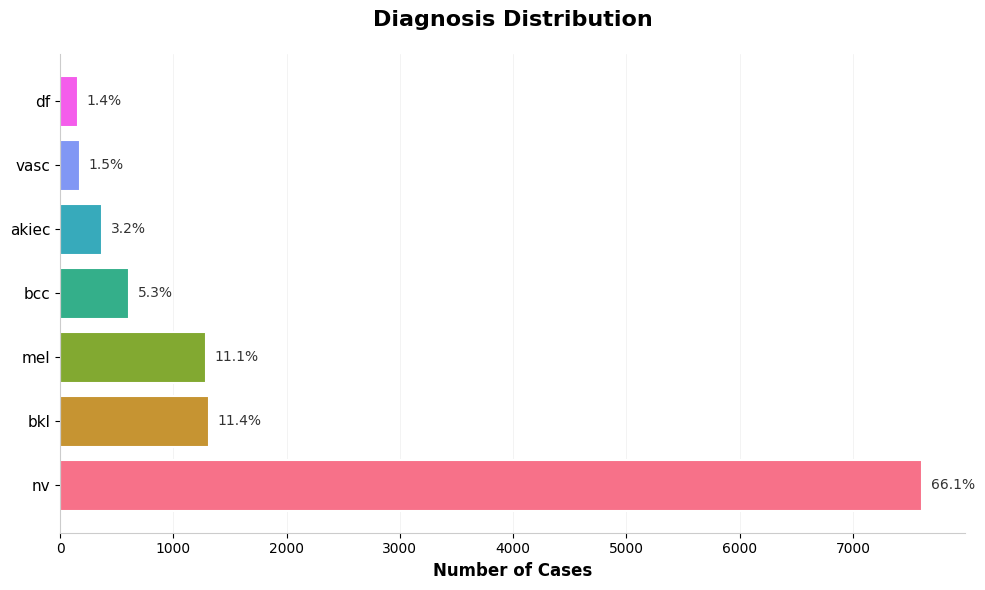


Diagnosis Distribution (%)
dx
nv       66.1
bkl      11.4
mel      11.1
bcc       5.3
akiec     3.2
vasc      1.5
df        1.4
Name: proportion, dtype: float64


In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))

dx_counts = merged_df["dx"].value_counts()
dx_pct = (merged_df["dx"].value_counts(normalize=True) * 100).round(1)

colors = sns.color_palette("husl", len(dx_counts))

# Horizontal bar plot
bars = ax.barh(range(len(dx_counts)), dx_counts.values, color=colors, edgecolor='white', linewidth=1.5)

ax.set_yticks(range(len(dx_counts)))
ax.set_yticklabels(dx_counts.index, fontsize=11, fontweight='500')
ax.set_xlabel('Number of Cases', fontsize=12, fontweight='bold')
ax.set_title('Diagnosis Distribution', fontsize=16, fontweight='bold', pad=20)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')

ax.grid(axis='x', alpha=0.2, linestyle='-', linewidth=0.5)
ax.set_axisbelow(True)

# Add value labels
for i, (count, pct) in enumerate(zip(dx_counts.values, dx_pct.values)):
    ax.text(count + max(dx_counts.values)*0.01, i, f'{pct}%', 
            va='center', fontsize=10, fontweight='500', color='#333333')

plt.tight_layout()
plt.show()

print("\nDiagnosis Distribution (%)")
print(dx_pct)


## 1.2 Demographic Patters

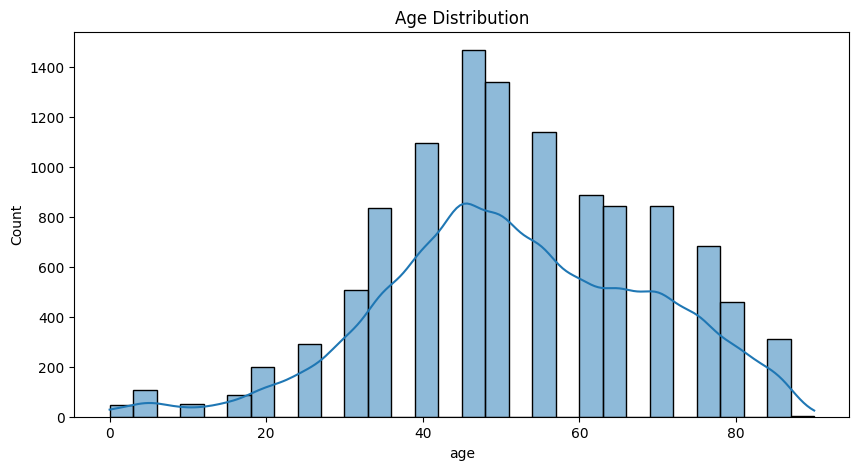

In [ ]:
# Age Distribution
plt.figure(figsize=(10,5))
sns.histplot(merged_df["age"], kde=True, bins=30)
plt.title("Age Distribution")
plt.show()

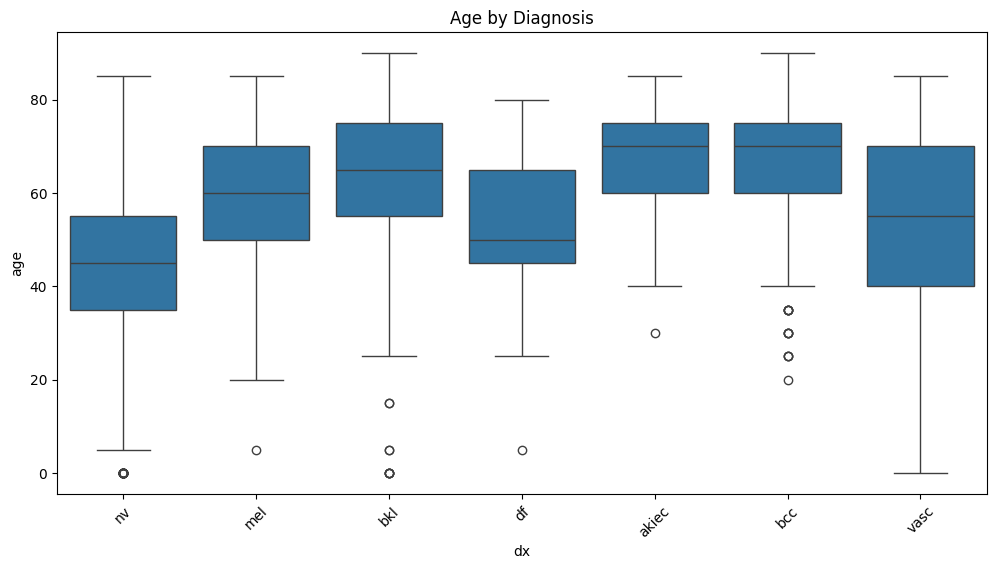

In [ ]:
# Age vs diagnosis
plt.figure(figsize=(12,6))
sns.boxplot(data=merged_df, x="dx", y="age")
plt.xticks(rotation=45)
plt.title("Age by Diagnosis")
plt.show()

C:\Users\tomas\AppData\Local\Temp\ipykernel_7396\2819589059.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=merged_df, x="dx", y="age", order=dx_order, palette="Set2", ax=axes[0])


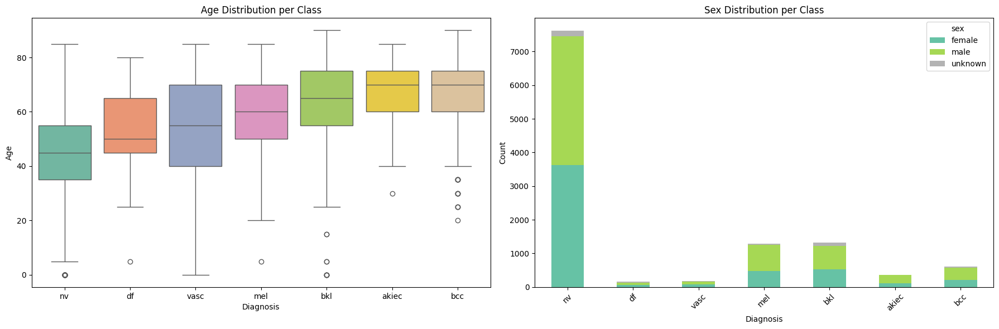

In [ ]:
# Age & Sex distribution per class

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Age
dx_order = merged_df.groupby("dx")["age"].median().sort_values().index

sns.boxplot(data=merged_df, x="dx", y="age", order=dx_order, palette="Set2", ax=axes[0])
axes[0].set_title("Age Distribution per Class")
axes[0].set_xlabel("Diagnosis")
axes[0].set_ylabel("Age")

# Sex
sex_counts = merged_df.groupby(["dx", "sex"]).size().unstack(fill_value=0)
sex_counts = sex_counts.loc[dx_order]  # same order as boxplot
sex_counts.plot(kind="bar", stacked=True, colormap="Set2", ax=axes[1])
axes[1].set_title("Sex Distribution per Class")
axes[1].set_xlabel("Diagnosis")
axes[1].set_ylabel("Count")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

## 1.3 Body Location

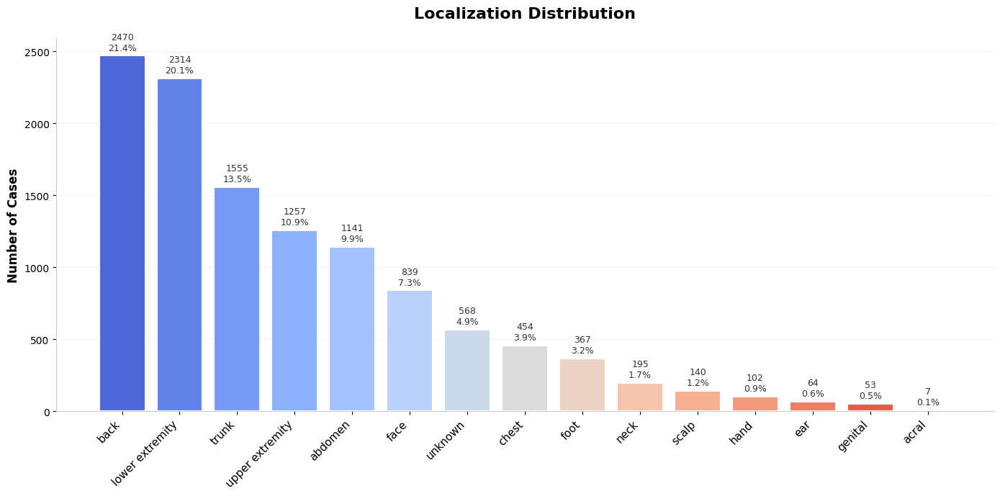


Localization Distribution (%)
localization
back               21.4
lower extremity    20.1
trunk              13.5
upper extremity    10.9
abdomen             9.9
face                7.3
unknown             4.9
chest               3.9
foot                3.2
neck                1.7
scalp               1.2
hand                0.9
ear                 0.6
genital             0.5
acral               0.1
Name: proportion, dtype: float64


In [ ]:
fig, ax = plt.subplots(figsize=(14, 7))

loc_counts = merged_df["localization"].value_counts()
loc_pct = (merged_df["localization"].value_counts(normalize=True) * 100).round(1)

colors = sns.color_palette("coolwarm", len(loc_counts))

bars = ax.bar(range(len(loc_counts)), loc_counts.values, color=colors, edgecolor='white', linewidth=1.5)

ax.set_xticks(range(len(loc_counts)))
ax.set_xticklabels(loc_counts.index, fontsize=11, fontweight='500', rotation=45, ha='right')
ax.set_ylabel('Number of Cases', fontsize=12, fontweight='bold')
ax.set_title('Localization Distribution', fontsize=16, fontweight='bold', pad=20)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')

ax.grid(axis='y', alpha=0.2, linestyle='-', linewidth=0.5)
ax.set_axisbelow(True)

for i, (count, pct) in enumerate(zip(loc_counts.values, loc_pct.values)):
    ax.text(i, count + max(loc_counts.values)*0.01, f'{int(count)}\n{pct}%', 
            ha='center', va='bottom', fontsize=9, fontweight='500', color='#333333')

plt.tight_layout()
plt.show()

print("\nLocalization Distribution (%)")
print(loc_pct)

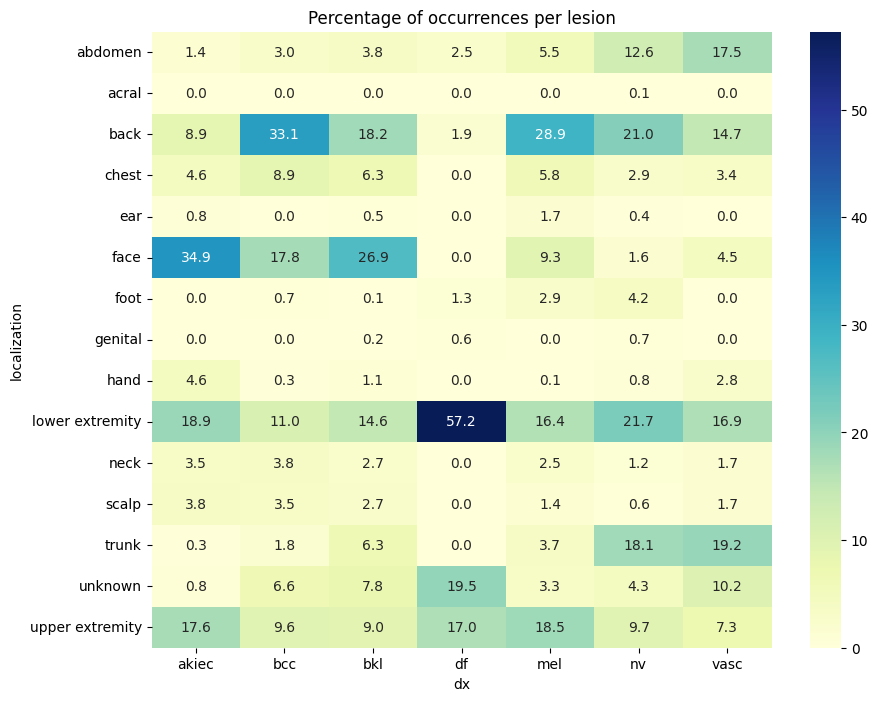

In [ ]:
ct = pd.crosstab(merged_df['localization'], merged_df['dx'], normalize='columns') * 100

plt.figure(figsize=(10, 8))
sns.heatmap(ct, annot=True, cmap='YlGnBu', fmt='.1f')
plt.title('Percentage of occurrences per lesion')
plt.show()

C:\Users\tomas\AppData\Local\Temp\ipykernel_7396\520570325.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(x='localization', y='age', data=merged_df, palette='viridis')


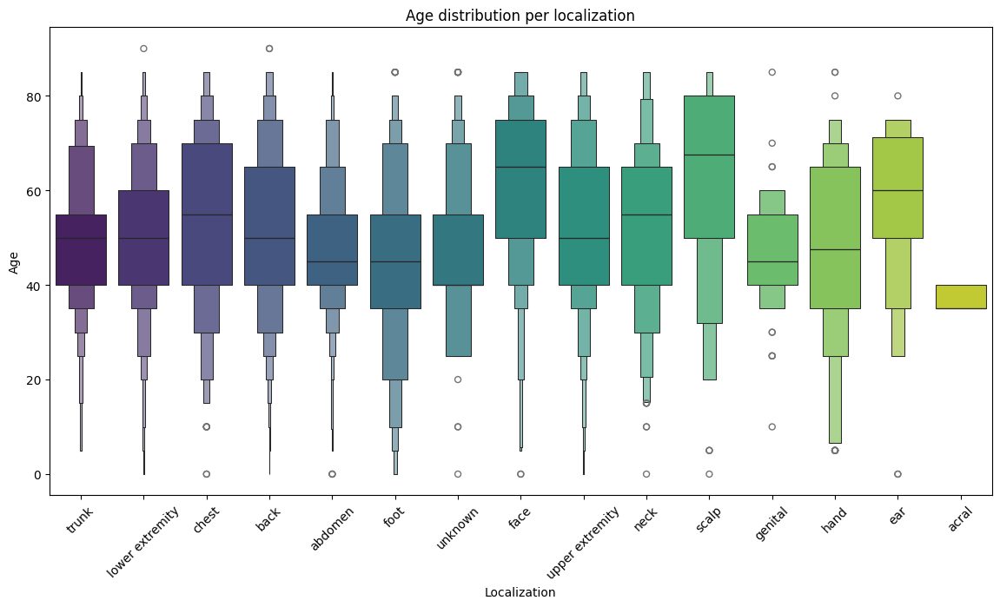

In [ ]:
plt.figure(figsize=(14, 7))
sns.boxenplot(x='localization', y='age', data=merged_df, palette='viridis')
plt.xticks(rotation=45)
plt.title('Age distribution per localization')
plt.xlabel('Localization')
plt.ylabel('Age')
plt.show()

## 1.4 Image Level EDA

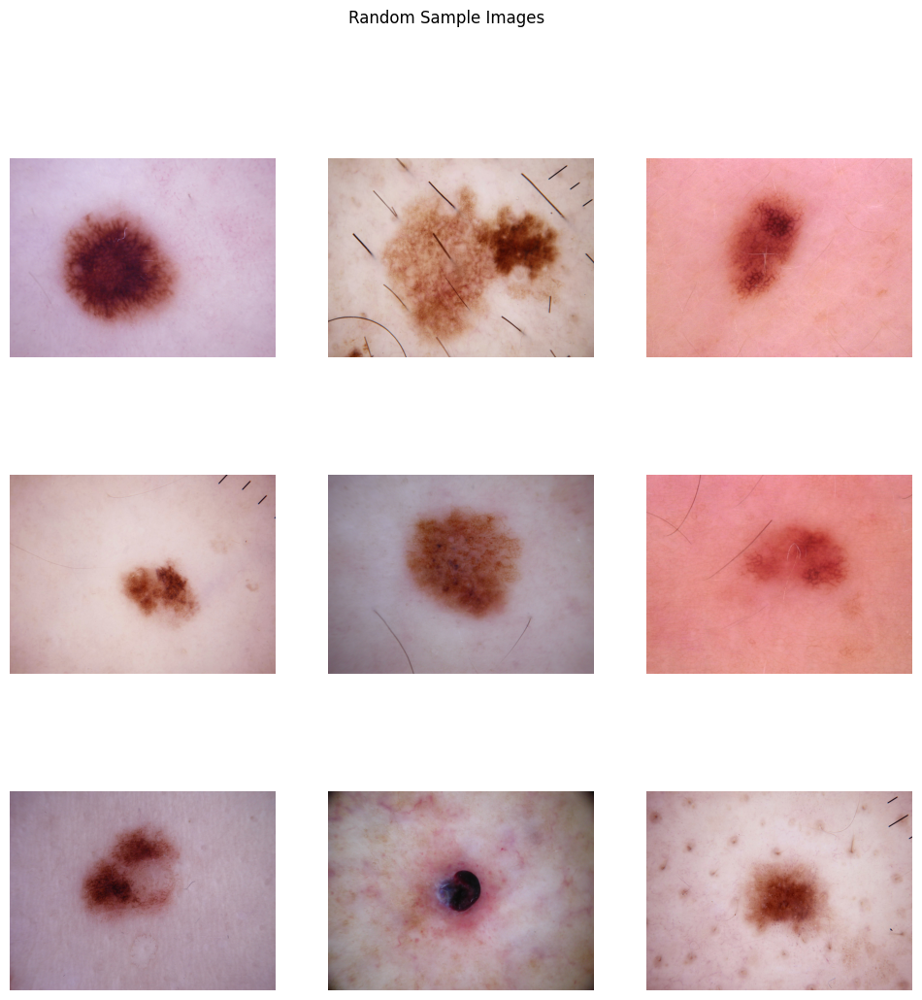

In [ ]:
# Display random images

sample_paths = merged_df["image_path"].sample(9).tolist()

plt.figure(figsize=(12,12))
for i, path in enumerate(sample_paths):
    plt.subplot(3,3,i+1)
    img = Image.open(path)
    plt.imshow(img)
    plt.axis("off")
plt.suptitle("Random Sample Images")
plt.show()

In [ ]:
img_stats_df = merged_df.copy()[['image_path', 'dx', 'lesion_id']]

with ThreadPoolExecutor(max_workers=64) as executor:
    results = list(tqdm(executor.map(load_image_info, img_stats_df['image_path']), total=len(img_stats_df)))

modes, widths, heights, means, stds, arrays = map(list, zip(*results))

# POPULATE DF 
img_stats_df["width"]     = widths
img_stats_df["height"]    = heights
img_stats_df["img_mean"]  = means
img_stats_df["img_std"]   = stds

arrays = np.stack(arrays)
print(f"Loaded {len(arrays)} images")

100%|██████████| 11526/11526 [01:12<00:00, 158.30it/s] 


Loaded 11526 images


In [ ]:
# MODE DISTRIBUTION 
print(f"Modes: {set(modes)} - All images are RGB!")

Modes: {'RGB'} - All images are RGB!


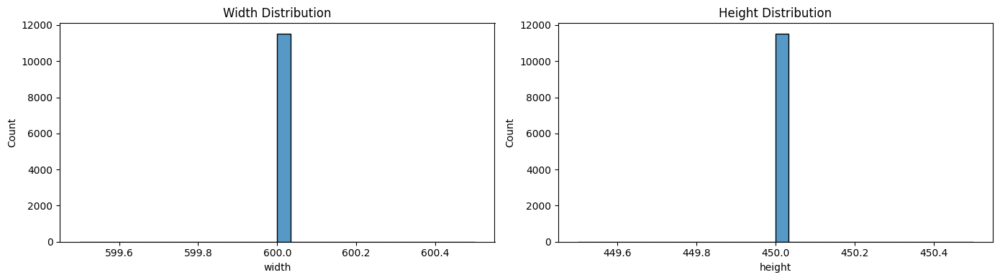

<Figure size 640x480 with 0 Axes>

In [ ]:
# SIZE DISTRIBUTIONS
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
sns.histplot(img_stats_df["width"],    bins=30, ax=axes[0]).set_title("Width Distribution")
sns.histplot(img_stats_df["height"],   bins=30, ax=axes[1]).set_title("Height Distribution")
plt.tight_layout()
plt.show()

# BRIGHTNESS / CONTRAST 
sns.histplot(img_stats_df["img_mean"], bins=30, ax=axes[0]).set_title("Brightness Distribution")
sns.histplot(img_stats_df["img_std"],  bins=30, ax=axes[1]).set_title("Contrast Distribution")
plt.tight_layout()
plt.show()

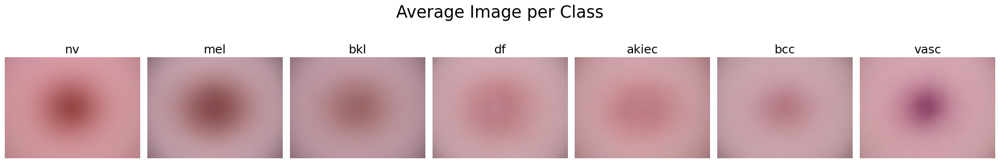

In [ ]:
# AVERAGE IMAGE PER CLASS
classes = img_stats_df["dx"].dropna().unique()
fig, axes = plt.subplots(1, len(classes), figsize=(len(classes) * 3, 4))

for i, cls in enumerate(classes):
    idx = img_stats_df[img_stats_df["dx"] == cls].index
    mean_img = arrays[idx].mean(axis=0).astype(np.uint8)
    axes[i].imshow(mean_img)
    axes[i].set_title(cls, fontsize=18)
    axes[i].axis("off")

plt.suptitle("Average Image per Class", fontsize=25)
plt.tight_layout()
plt.show()

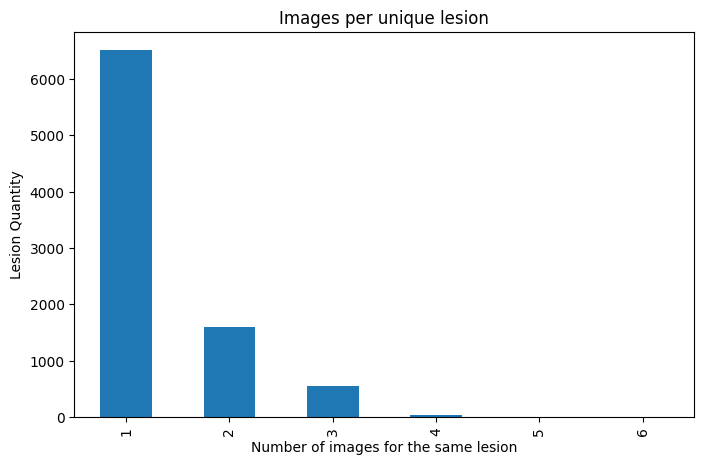

In [ ]:
# IMAGES PER LESION 
count_lesions = img_stats_df.groupby("lesion_id").size().value_counts().sort_index()
count_lesions.plot(kind="bar", figsize=(8, 5))
plt.title("Images per unique lesion")
plt.xlabel("Number of images for the same lesion")
plt.ylabel("Lesion Quantity")
plt.show()

## 1.5 Lesion ID Analysis

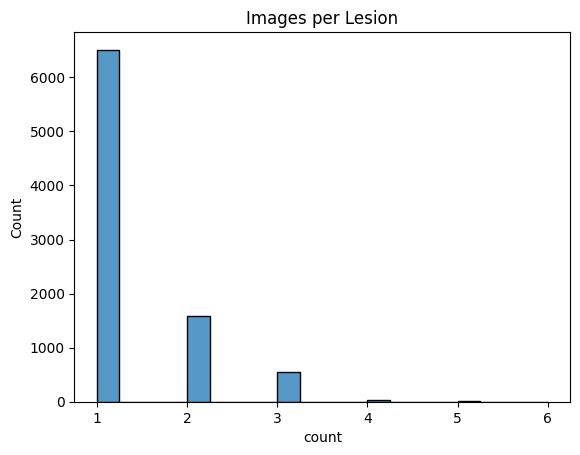

lesion_id
HAM_0001863    6
HAM_0005263    6
HAM_0003789    6
HAM_0000835    6
HAM_0007343    5
Name: count, dtype: int64

In [ ]:
lesion_counts = merged_df["lesion_id"].value_counts()
lesion_counts.describe()

sns.histplot(lesion_counts, bins=20)
plt.title("Images per Lesion")
plt.show()

# Check lesions with multiple images
lesion_counts[lesion_counts > 1].head()

## 1.6 Confirmation Method Analysis

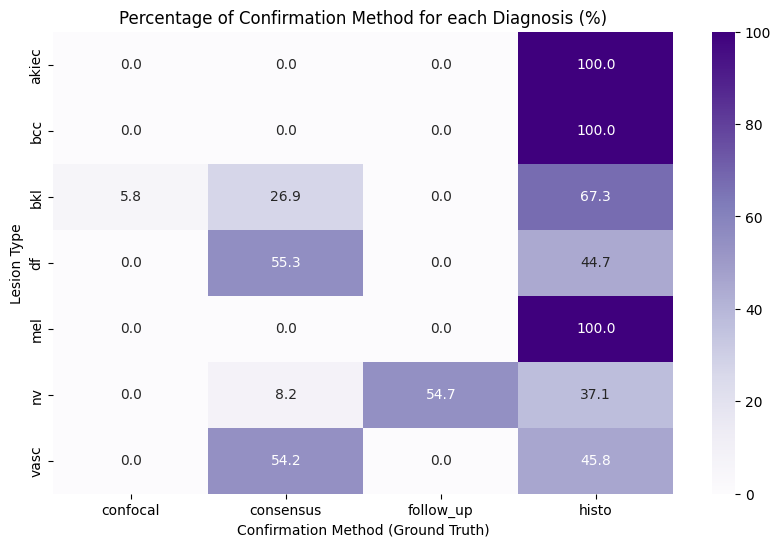

In [ ]:
conf_ct = pd.crosstab(merged_df['dx'], merged_df['dx_type'], normalize='index') * 100

plt.figure(figsize=(10, 6))
sns.heatmap(conf_ct, annot=True, cmap='Purples', fmt='.1f')
plt.title('Percentage of Confirmation Method for each Diagnosis (%)')
plt.xlabel('Confirmation Method (Ground Truth)')
plt.ylabel('Lesion Type')
plt.show()

## 1.7 Advanced Visual EDA (UMAP on Image Embeddings)

C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 11526/11526 [19:38<00:00,  9.78it/s]


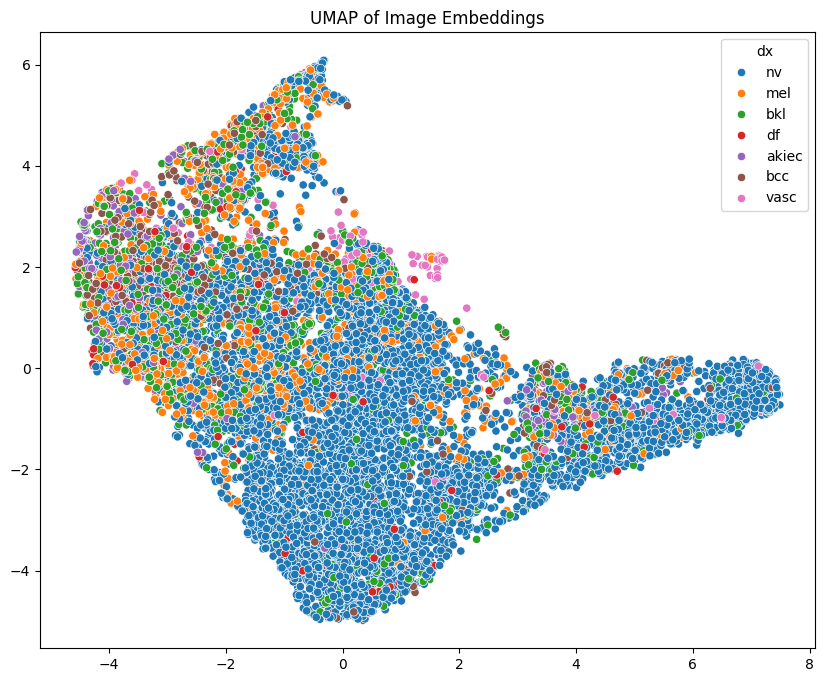

In [ ]:
model = models.resnet18(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1])
model.eval()

transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor()
])

embeddings = []

for path in tqdm(merged_df["image_path"]):
    img = Image.open(path).convert("RGB")
    x = transform(img).unsqueeze(0)
    with torch.no_grad():
        emb = model(x).squeeze().numpy()
    embeddings.append(emb)

reducer = umap.UMAP()
embedding_2d = reducer.fit_transform(embeddings)

plt.figure(figsize=(10,8))
sns.scatterplot(x=embedding_2d[:,0], y=embedding_2d[:,1], hue=merged_df["dx"], palette="tab10")
plt.title("UMAP of Image Embeddings")
plt.show()

## 1.8 Duplicated lesion cases

The structure:
- understand the lesion that has the highest number of images "HAM_0003789".
- Test to understand if there are characteristics that change for the same lesion
- Distribution of duplicates in the variables and the respective percentages.

Key findings:

- 9 lesions have images from different `dataset` sources, and 2 of those also show different `localization` values.

- **Diagnosis (dx) & Severity**: More severe/suspicious lesions have significantly higher duplication rates. Melanoma (mel, 62.5%) and Basal Cell Carcinoma (bcc, 46.5%) are the most frequently duplicated, while common nevi (nv) are the least (18.3%).
- **Verification Method (dx_type)**: Lesions requiring deep clinical verification (e.g., confocal at 73.5% and histo at 55.5%) present the highest duplications. Conversely, follow_up has a 0% duplication rate, implying that maybe temporal follow-ups are being recorded as entirely distinct lesions rather than duplicate images attached to the same lesion ID.
- **Localization (Anatomy)**: Complex, hard-to-photograph, or high-risk anatomical areas exhibit higher duplication rates, led by acral (66.7%), chest (52.9%), and ear (51.4%). (1- Zona Acral (Palmas das mãos e plantas dos pés e unhas). 2- Orelhas (Pavilhão auricular e canal auditivo externo). 3-Nariz (Especialmente as abas nasais e a ponta). 4- Pálpebras)
- **Dataset Source Bias**: Duplication behaviors are heavily protocol-driven. The vidir_modern dataset contains 74.5% duplications, whereas vidir_molemax has none (0%). This might be a crucial finding for train/test splits to ensure models don't inadvertently learn these dataset-specific duplication behaviors.


**Next steps:**
Handling Lesion Duplicates & Train/Test Splitting

1. Quick Data Cleanup
- remove the 2 lesions with different locations.
- dont use dataset origin for the modeling.


2. Splitting Options
-  We group all images by `lesion_id` so that all images of the same lesion stay together. We then randomly split 80/20 at the *lesion level*, making sure to stratify by diagnosis (`dx`) so the class proportions stay balanced.
-  Any lesion with >1 image automatically goes into the Training set. We only perform the 80/20 split on lesions that have exactly 1 image.


In [ ]:
# 1. Total images per class
print(merged_df["dx"].value_counts())

# 2. Unique lesions per class
print(merged_df.drop_duplicates(subset="lesion_id")["dx"].value_counts())


dx
nv       7613
bkl      1316
mel      1284
bcc       607
akiec     370
vasc      177
df        159
Name: count, dtype: int64
dx
nv       6173
bkl       896
mel       723
bcc       400
akiec     259
vasc      128
df        113
Name: count, dtype: int64


#### HAM_0003789 case

In [ ]:
merged_df[merged_df["lesion_id"]=="HAM_0003789"]

,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset
609,ISIC_0024915,./data\HAM10000_images_part_1\ISIC_0024915.jpg,HAM_0003789,bkl,confocal,55.0,female,face,vidir_modern
1710,ISIC_0026016,./data\HAM10000_images_part_1\ISIC_0026016.jpg,HAM_0003789,bkl,confocal,55.0,female,face,vidir_modern
5158,ISIC_0029464,./data\HAM10000_images_part_2\ISIC_0029464.jpg,HAM_0003789,bkl,confocal,55.0,female,face,vidir_modern
5199,ISIC_0029505,./data\HAM10000_images_part_2\ISIC_0029505.jpg,HAM_0003789,bkl,confocal,55.0,female,face,vidir_modern
6971,ISIC_0031277,./data\HAM10000_images_part_2\ISIC_0031277.jpg,HAM_0003789,bkl,confocal,55.0,female,face,vidir_modern
7547,ISIC_0031853,./data\HAM10000_images_part_2\ISIC_0031853.jpg,HAM_0003789,bkl,confocal,55.0,female,face,vidir_modern


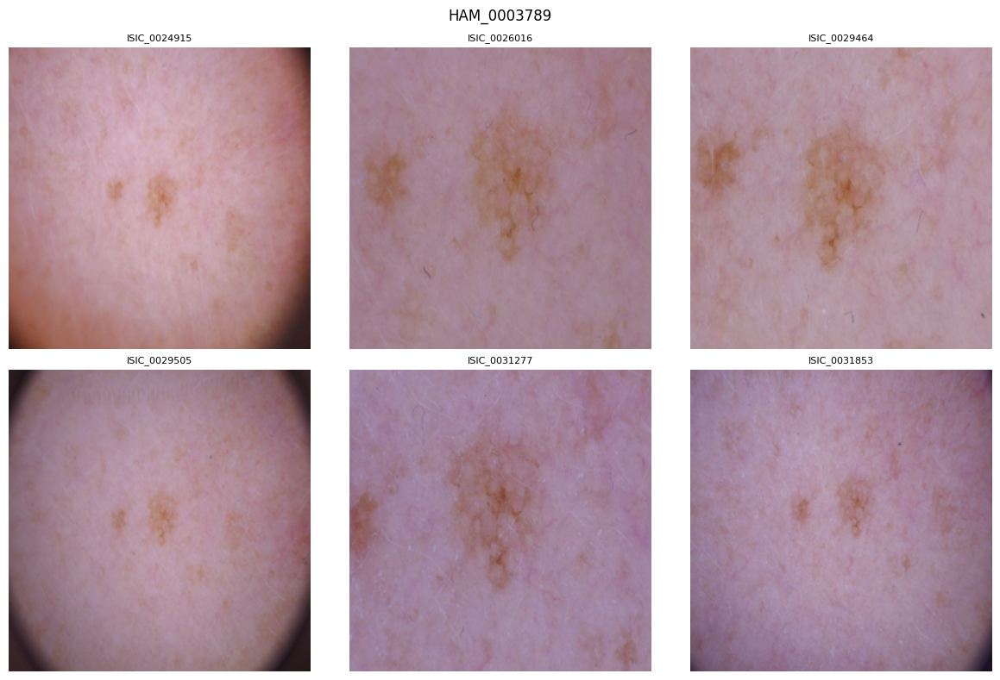

In [ ]:
# Get all image_ids for this lesion
lesion_image_ids = merged_df[merged_df["lesion_id"] == "HAM_0003789"]["image_id"].values

# Find the matching image paths from your folder
lesion_paths = [Path(p) for p in images_df['image_path'] if Path(p).stem in lesion_image_ids]

# Plot them
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

if len(lesion_paths) == 1:
    axes = [axes]

for ax, img_path in zip(axes, lesion_paths):
    img = Image.open(img_path).resize((224, 224))
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(img_path.stem, fontsize=8)

plt.suptitle("HAM_0003789", fontsize=12)
plt.tight_layout()
plt.show()

#### Test to understand if there are characteristics that change for the same lesion

In [ ]:
inconsistent = merged_df.groupby("lesion_id")["dx_type"].nunique()
print(f"Lesions with more than one dx_type: {(inconsistent > 1).sum()}")

Lesions with more than one dx_type: 0


In [ ]:
# List of columns to ignore because they naturally change per image
ignore_cols = ["lesion_id", "file_size_kb"]

# Check all other columns
cols_to_check = [col for col in merged_df.columns if col not in ignore_cols]

for col in cols_to_check:
    inconsistent_count = (merged_df.groupby("lesion_id")[col].nunique() > 1).sum()
    
    if inconsistent_count > 0:
        print(f"Lesions with more than one '{col}': {inconsistent_count}")
    else:
        print(f"'{col}' is perfectly consistent per lesion.")


Lesions with more than one 'image_id': 2182
Lesions with more than one 'image_path': 2182
'dx' is perfectly consistent per lesion.
'dx_type' is perfectly consistent per lesion.
'age' is perfectly consistent per lesion.
'sex' is perfectly consistent per lesion.
Lesions with more than one 'localization': 2
Lesions with more than one 'dataset': 10


In [ ]:
for col in ["localization", "dataset"]:
    # Find the lesion_ids that have more than 1 unique value in this column
    inconsistent_counts = merged_df.groupby("lesion_id")[col].nunique()
    problem_lesions = inconsistent_counts[inconsistent_counts > 1].index
    
    # Filter the dataset to show all rows for those problem lesions
    problem_data = merged_df[merged_df["lesion_id"].isin(problem_lesions)]
    
    print(f"\n--- Lesions with inconsistent '{col}' ---")
    # Sorting by lesion_id makes it easy to compare images of the same lesion side-by-side
    display(problem_data.sort_values(by="lesion_id"))



--- Lesions with inconsistent 'localization' ---


,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset
1658,ISIC_0025964,./data\HAM10000_images_part_1\ISIC_0025964.jpg,HAM_0000871,mel,histo,40.0,female,chest,vidir_modern
2200,ISIC_0026506,./data\HAM10000_images_part_1\ISIC_0026506.jpg,HAM_0000871,mel,histo,40.0,female,trunk,vidir_molemax
6317,ISIC_0030623,./data\HAM10000_images_part_2\ISIC_0030623.jpg,HAM_0000871,mel,histo,40.0,female,chest,vidir_modern
61,ISIC_0024367,./data\HAM10000_images_part_1\ISIC_0024367.jpg,HAM_0001726,mel,histo,35.0,female,back,vidir_modern
394,ISIC_0024700,./data\HAM10000_images_part_1\ISIC_0024700.jpg,HAM_0001726,mel,histo,35.0,female,trunk,vidir_molemax
4975,ISIC_0029281,./data\HAM10000_images_part_1\ISIC_0029281.jpg,HAM_0001726,mel,histo,35.0,female,back,vidir_modern



--- Lesions with inconsistent 'dataset' ---


,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset
10403,ISIC_0034918,./data\ISIC2018_Task3_Test_Images\ISIC_0034918...,HAMTEST_0000059,mel,histo,60.0,male,back,vidir_modern
10074,ISIC_0034584,./data\ISIC2018_Task3_Test_Images\ISIC_0034584...,HAMTEST_0000059,mel,histo,60.0,male,back,vidir_molemax
10146,ISIC_0034657,./data\ISIC2018_Task3_Test_Images\ISIC_0034657...,HAMTEST_0000059,mel,histo,60.0,male,back,vidir_modern
5553,ISIC_0029859,./data\HAM10000_images_part_2\ISIC_0029859.jpg,HAM_0000492,mel,histo,75.0,male,abdomen,vidir_molemax
2770,ISIC_0027076,./data\HAM10000_images_part_1\ISIC_0027076.jpg,HAM_0000492,mel,histo,75.0,male,abdomen,vidir_modern
4139,ISIC_0028445,./data\HAM10000_images_part_1\ISIC_0028445.jpg,HAM_0000492,mel,histo,75.0,male,abdomen,vidir_modern
1658,ISIC_0025964,./data\HAM10000_images_part_1\ISIC_0025964.jpg,HAM_0000871,mel,histo,40.0,female,chest,vidir_modern
2200,ISIC_0026506,./data\HAM10000_images_part_1\ISIC_0026506.jpg,HAM_0000871,mel,histo,40.0,female,trunk,vidir_molemax
6317,ISIC_0030623,./data\HAM10000_images_part_2\ISIC_0030623.jpg,HAM_0000871,mel,histo,40.0,female,chest,vidir_modern
394,ISIC_0024700,./data\HAM10000_images_part_1\ISIC_0024700.jpg,HAM_0001726,mel,histo,35.0,female,trunk,vidir_molemax


**Inconsistencies found:** 9 lesions have images from different `dataset` sources, and 2 of those also show different `localization` values, suggesting the localization mismatch is a side effect of cross-dataset annotation differences, not a true change in body location.

**Implications:**
- **Data leakage risk:** if we split by `lesion_id`, images of the same lesion may come from different datasets with different capture conditions.
- **Label noise:** conflicting `localization` values add noise to any analysis or model that uses body location as a feature.
- **Low impact:** only 9 out of 7,470 lesions are affected (~0.12%), so the overall effect is minimal.


In [ ]:
# from the 7470 unique lesions
print(merged_df.groupby("lesion_id").size().value_counts().sort_index())

1    6510
2    1589
3     547
4      37
5       5
6       4
Name: count, dtype: int64


random visualization of duplicated lesion

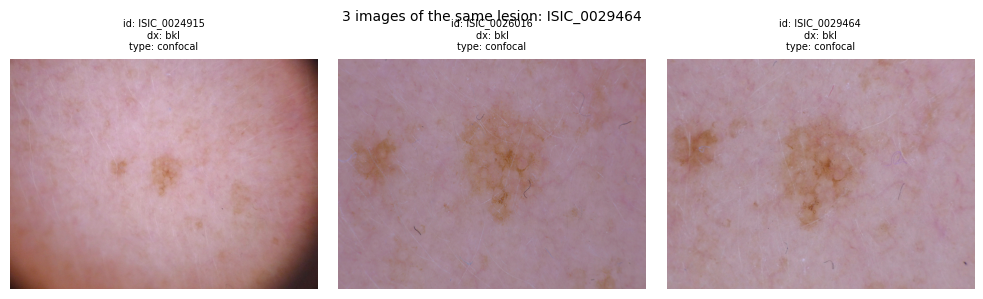

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(10, 3))

for ax, image_id in zip(axes, lesion_image_ids):
    img_path = next((p for p in images_df['image_path'] if Path(p).stem == image_id), None)
    img = Image.open(img_path)
    row = merged_df[merged_df["image_id"] == image_id].iloc[0]
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"id: {image_id}\ndx: {row['dx']}\ntype: {row['dx_type']}", fontsize=7)

plt.suptitle(f"3 images of the same lesion: {image_id}", fontsize=10)
plt.tight_layout()
plt.show()

#### Distribution of duplicates in the variables and the respective percentages.

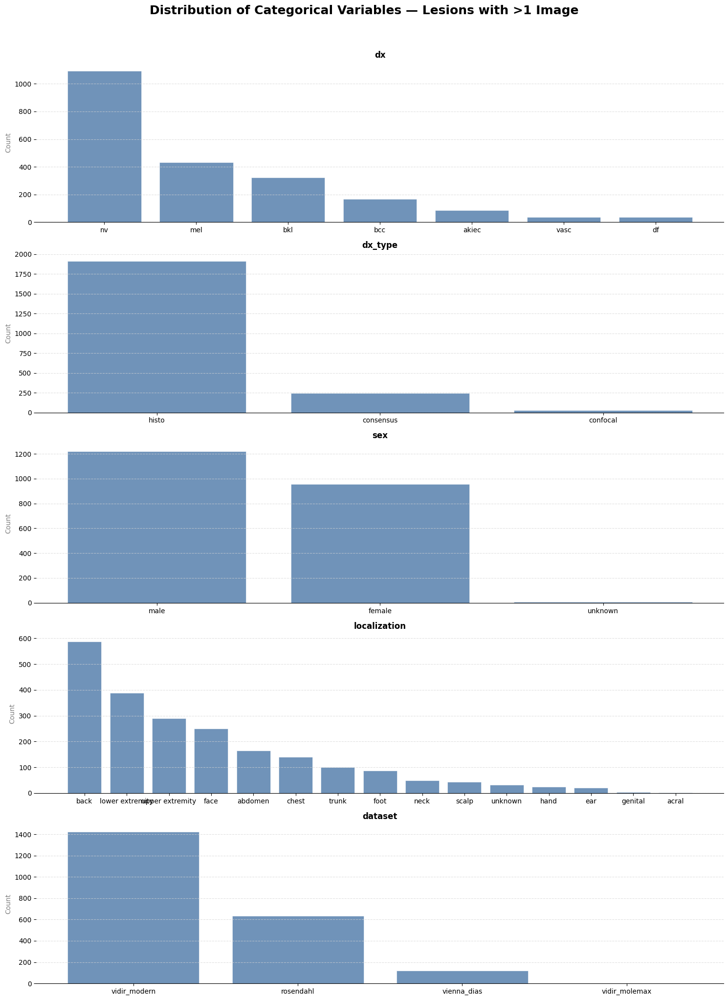

In [ ]:
# Define categorical columns of interest
low_cardinality = ['dx', 'dx_type', 'sex', 'localization', 'dataset']

# --- Filter: keep only lesions that appear more than once ---
lesion_counts = merged_df.groupby("lesion_id").size()            # count images per lesion
multi_image_lesions = lesion_counts[lesion_counts > 1].index # keep only those with >1
data_multi = merged_df[merged_df["lesion_id"].isin(multi_image_lesions)]

# --- Layout: 1 plot per row ---
ncols = 1  # <-- change this to control columns per row
nrows = math.ceil(len(low_cardinality) / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4 * nrows))
axes_flat = axes.flatten()

# --- Remove duplicate lesions so each lesion is counted once ---
data_unique = data_multi.drop_duplicates(subset="lesion_id")

# --- Loop through each categorical variable and plot ---
for i, var in enumerate(low_cardinality):
    ax = axes_flat[i]
    counts = data_unique[var].value_counts()
    ax.bar(counts.index.astype(str), counts.values, color="#4C78A8", edgecolor="white", linewidth=0.5, alpha=0.8)
    ax.set_title(var, fontsize=12, fontweight='bold', pad=8)
    ax.set_ylabel("Count", fontsize=10, color="gray")
    ax.yaxis.grid(True, linestyle='--', color='lightgray', alpha=0.7)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

# --- Hide any leftover empty subplots ---
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].set_visible(False)

fig.suptitle("Distribution of Categorical Variables — Lesions with >1 Image", fontsize=18, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

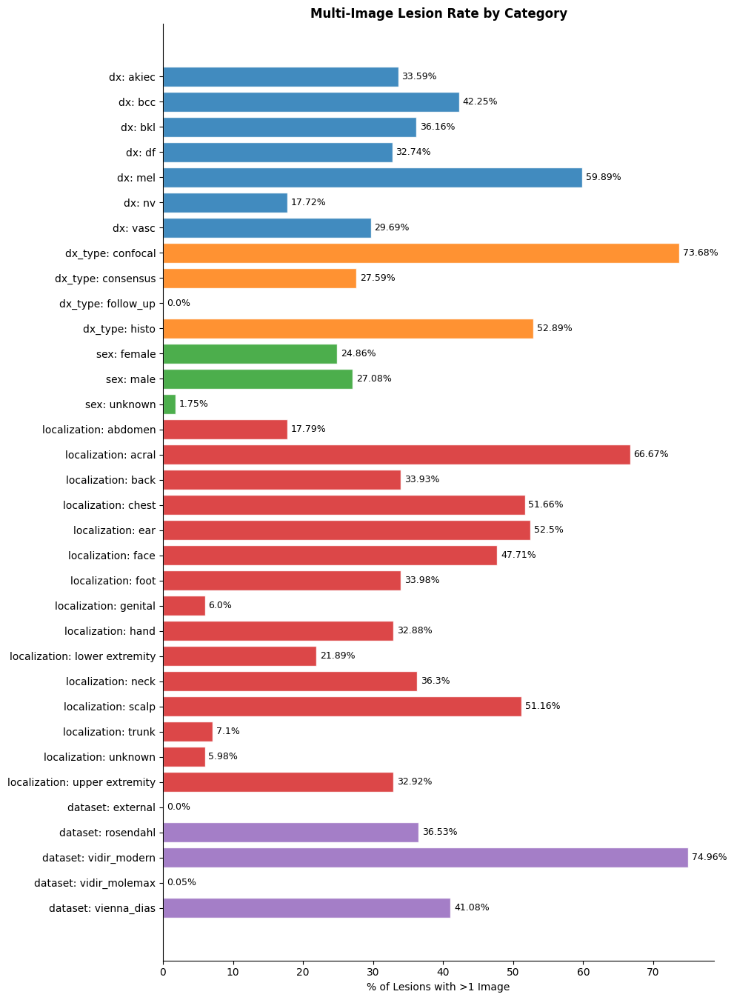

In [ ]:
# Identify lesions with multiple images using counts
counts = merged_df["lesion_id"].value_counts()
data_unique = merged_df.drop_duplicates("lesion_id").copy()
data_unique["multi_image"] = data_unique["lesion_id"].map(counts) > 1

# Calculate percentage of multi-image lesions per category
df_pct = pd.concat([
    data_unique.groupby(var)["multi_image"]
    .agg(total="count", multi="sum")
    .assign(pct=lambda x: (x.multi / x.total * 100).round(2), Variable=var)
    .reset_index()
    .rename(columns={var: "Category", "pct": "%"})
    for var in low_cardinality
], ignore_index=True)

# Visualization setup
fig, ax = plt.subplots(figsize=(10, max(6, len(df_pct) * 0.4)))
colors = plt.cm.tab10.colors
color_map = {var: colors[i] for i, var in enumerate(low_cardinality)}

# Plot horizontal bars
y_labels = df_pct["Variable"] + ": " + df_pct["Category"]
bar_colors = df_pct["Variable"].map(color_map)
ax.barh(y_labels, df_pct["%"], color=bar_colors, edgecolor="white", alpha=0.85)

# Annotate bars with percentage values
for i, val in enumerate(df_pct["%"]):
    ax.text(val + 0.5, i, f"{val}%", va='center', fontsize=9)

# Styling and labels
ax.set_xlabel("% of Lesions with >1 Image")
ax.set_title("Multi-Image Lesion Rate by Category", fontweight='bold')
ax.invert_yaxis()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

# **2. Data Quality Verification**

## 2.1 Duplicates

### 2.1.1 Metadata Duplicates

In [13]:
# Exact duplicate rows
print(f"Exact duplicate rows: {merged_df.duplicated().sum()}")

# Lesions with multiple images (not an error, but important)
merged_df["lesion_id"].value_counts().head()

Exact duplicate rows: 0


lesion_id
HAM_0001863    6
HAM_0005263    6
HAM_0003789    6
HAM_0000835    6
HAM_0007343    5
Name: count, dtype: int64

### 2.1.2 Image-Level Duplicates & Issues

To ensure dataset integrity, we investigated two potential sources of duplicate images:

**Path-level duplicates** — two or more rows referencing the same image path, and therefore loading the same image.

**Pixel-level duplicates** — rows with distinct paths but identical pixel content.

In [14]:
print(f"Number of rows with the same image path: {len(merged_df) - merged_df['image_path'].nunique()}")

Number of rows with the same image path: 0


The first hypothesis was ruled out by inspection. To verify the second, we employed the CleanVision ImageLab library, which flags images sharing identical or near-identical pixel arrays. Additionally, we decided to leverage all the capabilities of the stated library, by searching for other issues, such as blurry, low information, and near duplicated images.

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


Computing hashes: 100%|██████████| 11526/11526 [00:36<00:00, 316.50it/s]


Issue checks completed. 463 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | blurry           |          423 |
|  1 | near_duplicates  |           36 |
|  2 | exact_duplicates |            4 |
|  3 | dark             |            0 |
|  4 | light            |            0 |
|  5 | odd_aspect_ratio |            0 |
|  6 | low_information  |            0 |
|  7 | grayscale        |            0 |
|  8 | odd_size         |            0 | 

---------------------- blurry images -----------------------

Number of examples with this issue: 423
Examples representing most severe instances of this issue:



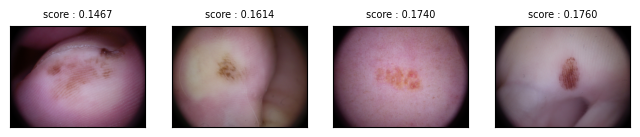

------------------ near_duplicates images ------------------

Number of examples with this issue: 36
Examples representing most severe instances of this issue:

Set: 0


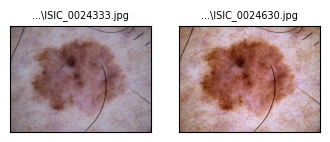

Set: 1


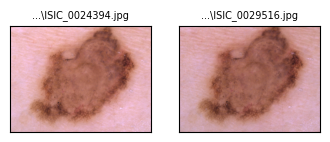

Set: 2


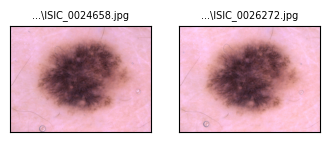

Set: 3


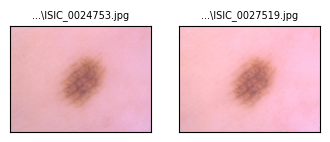

----------------- exact_duplicates images ------------------

Number of examples with this issue: 4
Examples representing most severe instances of this issue:

Set: 0


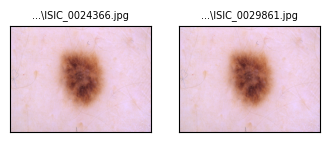

Set: 1


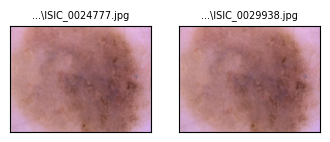

In [15]:
# Searching for images with issues
imagelab = Imagelab(filepaths=list(merged_df["image_path"]))
imagelab.find_issues()
imagelab.report(verbosity=4)

**Exact duplicates:**

4 images were identified. Both corresponded to duplicated lesion_id entries. As only one image per pair carries unique information, and the redundant copies were removed from the dataset.

In [16]:
# Filtering all the duplicated images paths
duplicated_paths = imagelab.issues[["is_exact_duplicates_issue"]].any(axis=1).reset_index().rename(columns={"index": "image_path", 0: "duplicated"})
duplicated_paths = duplicated_paths.loc[duplicated_paths["duplicated"] == True]
merged_df.loc[merged_df['image_path'].isin(duplicated_paths['image_path'])].sort_values('lesion_id')

,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset
471,ISIC_0024777,./data\HAM10000_images_part_1\ISIC_0024777.jpg,HAM_0001895,nv,histo,25.0,male,chest,vienna_dias
5632,ISIC_0029938,./data\HAM10000_images_part_2\ISIC_0029938.jpg,HAM_0001895,nv,histo,25.0,male,chest,vienna_dias
60,ISIC_0024366,./data\HAM10000_images_part_1\ISIC_0024366.jpg,HAM_0002300,nv,histo,35.0,female,back,vienna_dias
5555,ISIC_0029861,./data\HAM10000_images_part_2\ISIC_0029861.jpg,HAM_0002300,nv,histo,35.0,female,back,vienna_dias


In [17]:
print(f"Dataset size before removing the exact duplicates: {len(merged_df)}")
merged_df = merged_df.drop([471, 60])
print(f"Dataset size after removing the exact duplicates: {len(merged_df)}")

Dataset size before removing the exact duplicates: 11526
Dataset size after removing the exact duplicates: 11524


**Near-duplicates:**

36 images were flagged. Upon inspection, 16 pairs of near-duplicated images with the same lesion_id were found. These 32 images were removed, as they were adding redundant information into the dataset.

In [18]:
# Filtering all the duplicated images paths
near_duplicated_paths = imagelab.issues[["is_near_duplicates_issue"]].any(axis=1).reset_index().rename(columns={"index": "image_path", 0: "near_duplicated"})
near_duplicated_paths = near_duplicated_paths.loc[near_duplicated_paths["near_duplicated"] == True]
near_duplicated = merged_df.loc[merged_df['image_path'].isin(near_duplicated_paths['image_path'])].sort_values('lesion_id')
print(f"Number of repeated near duplicated images with the same lesion_id: {len(near_duplicated) - len(near_duplicated['lesion_id'].unique())}")

Number of repeated near duplicated images with the same lesion_id: 16


In [19]:
mask = near_duplicated.groupby('lesion_id')['lesion_id'].transform('size') > 1
duplicated_idx = near_duplicated[mask].index
near_duplicated = near_duplicated.drop(duplicated_idx)

The remaining 4 images metadata presented distinct information, including the lesion_id. Given this, we chose to kept them.

In [20]:
near_duplicated

,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset
10109,ISIC_0034619,./data\ISIC2018_Task3_Test_Images\ISIC_0034619...,HAMTEST_0000093,nv,follow_up,40.0,female,upper extremity,vidir_molemax
4988,ISIC_0029294,./data\HAM10000_images_part_1\ISIC_0029294.jpg,HAM_0003564,nv,follow_up,40.0,female,abdomen,vidir_molemax
7922,ISIC_0032228,./data\HAM10000_images_part_2\ISIC_0032228.jpg,HAM_0003984,nv,follow_up,30.0,male,back,vidir_molemax
9292,ISIC_0033598,./data\HAM10000_images_part_2\ISIC_0033598.jpg,HAM_0005496,nv,histo,15.0,female,lower extremity,vidir_modern


In [21]:
print(f"Dataset size before removing the exact duplicates: {len(merged_df)}")
merged_df = merged_df.drop(duplicated_idx)
print(f"Dataset size after removing the exact duplicates: {len(merged_df)}")

Dataset size before removing the exact duplicates: 11524
Dataset size after removing the exact duplicates: 11492


**Blurry images:**

 423 images were flagged.

In [22]:
blurry_paths = imagelab.issues[imagelab.issues["is_blurry_issue"]].any(axis=1).reset_index().rename(columns={"index": "image_path", 0: "blurry"})
blurry_paths = blurry_paths.loc[blurry_paths["blurry"] == True]
blurry_df = merged_df.iloc[blurry_paths.index].sort_values('lesion_id')

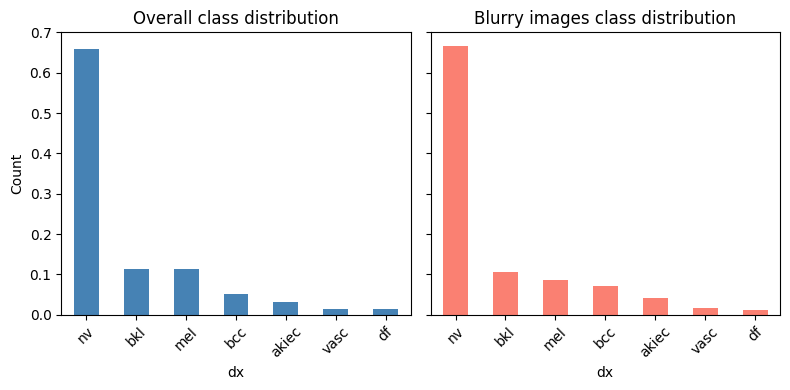

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

# overall
merged_df.loc[~merged_df.index.isin(blurry_df.index), "dx"].value_counts(normalize=True).plot(kind="bar", ax=axes[0], color="steelblue")
axes[0].set_title("Overall class distribution")
axes[0].set_ylabel("Count")
axes[0].tick_params(axis="x", rotation=45)

# blurry
merged_df.loc[blurry_df.index, "dx"].value_counts(normalize=True).plot(kind="bar", ax=axes[1], color="salmon")
axes[1].set_title("Blurry images class distribution")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

Their class distribution was found to be consistent with the overall dataset, indicating that blurriness occurs as random noise rather than being concentrated in any specific class. We opted to retain these images for two reasons: first, their removal would disproportionately reduce the already dominant nv class without providing meaningful benefit to minority classes; second, exposure to variable image quality during training is likely to improve model robustness, as real-world clinical images are inherently heterogeneous in quality.

## 2.2 Data Split

- **The split happens BEFORE any preprocessing to prevent data leakage.**
-  All imputers and outlier thresholds are fitted exclusively on the training set.

In [24]:
def create_dl_splits(df, train_frac=0.8, val_frac=0.1, test_frac=0.1, test=True, random_state=42):
    """
    Splits the dataset into Train, Validation, and Test sets.
    Ensures all images of the same lesion_id stay in the same set to prevent leakage.
    """
    temp_frac = val_frac + test_frac
    val_relative_frac = val_frac / temp_frac

    # First Split: Train vs rest
    gss1 = GroupShuffleSplit(n_splits=1, test_size=temp_frac, random_state=random_state)
    train_idx, temp_idx = next(gss1.split(df, groups=df['lesion_id']))

    train_df = df.iloc[train_idx].copy()
    temp_df = df.iloc[temp_idx].copy()

    if not test:
        print(f"Total images: {len(df)}")
        print(f"Train: {len(train_df)} images | {train_df['lesion_id'].nunique()} unique lesions")
        print(f"Val:   {len(temp_df)} images | {temp_df['lesion_id'].nunique()} unique lesions")

        # Leakage verification
        train_ids = set(train_df['lesion_id'])
        val_ids   = set(temp_df['lesion_id'])

        assert len(train_ids.intersection(val_ids)) == 0,  "Leakage between Train and Val!"
        print("Leakage check passed! No overlapping lesions.\n")

        return train_df, temp_df

    # Second Split: Validation vs Test
    gss2 = GroupShuffleSplit(n_splits=1, test_size=val_relative_frac, random_state=random_state)
    val_idx, test_idx = next(gss2.split(temp_df, groups=temp_df['lesion_id']))

    val_df = temp_df.iloc[val_idx].copy()
    test_df = temp_df.iloc[test_idx].copy()

    print(f"Total images: {len(df)}")
    print(f"Train: {len(train_df)} images | {train_df['lesion_id'].nunique()} unique lesions")
    print(f"Val:   {len(val_df)} images | {val_df['lesion_id'].nunique()} unique lesions")
    print(f"Test:  {len(test_df)} images | {test_df['lesion_id'].nunique()} unique lesions\n")

    # Leakage verification
    train_ids = set(train_df['lesion_id'])
    val_ids   = set(val_df['lesion_id'])
    test_ids  = set(test_df['lesion_id'])

    assert len(train_ids.intersection(val_ids)) == 0,  "Leakage between Train and Val!"
    assert len(train_ids.intersection(test_ids)) == 0, "Leakage between Train and Test!"
    assert len(val_ids.intersection(test_ids)) == 0,   "Leakage between Val and Test!"
    print("Leakage check passed! No overlapping lesions.\n")

    return train_df, val_df, test_df

In [25]:
train_df, val_df, test_df = create_dl_splits(merged_df, train_frac=0.8, val_frac=0.1, test_frac=0.1)

Total images: 11492
Train: 9214 images | 6945 unique lesions
Val:   1152 images | 868 unique lesions
Test:  1126 images | 869 unique lesions

Leakage check passed! No overlapping lesions.



In [26]:
dist_df = pd.DataFrame({
    'Train %': train_df['dx'].value_counts(normalize=True) * 100,
    'Val %': val_df['dx'].value_counts(normalize=True) * 100,
    'Test %': test_df['dx'].value_counts(normalize=True) * 100
}).round(1)

print("Class Distribution Across Splits:")
print(dist_df)

Class Distribution Across Splits:
       Train %  Val %  Test %
dx                           
akiec      3.4    2.6     2.6
bcc        5.3    4.8     5.8
bkl       11.7   11.1     9.7
df         1.6    0.6     0.7
mel       11.2   10.4    11.3
nv        65.2   69.4    69.1
vasc       1.7    1.1     0.9


# **3. Data Preprocessing**

## 3.1 Missing Values Imputation

### 3.1.1 Analysis

In [27]:
age_nulls = train_df[train_df['age'].isnull()]
print(f"Total number of rows with null age: {len(age_nulls)}")

# see if these missing values belong to a specific diagnose
print(age_nulls['dx'].value_counts())

Total number of rows with null age: 269
dx
nv       118
bkl       71
df        23
bcc       23
mel       19
vasc      12
akiec      3
Name: count, dtype: int64


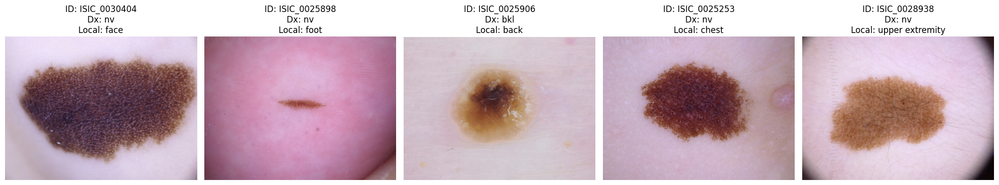

In [28]:
babies_df = train_df[train_df['age'] == 0].sample(min(5, len(train_df[train_df['age'] == 0])))

# see if these missing values could mean "no year" / months of ages / babies
plt.figure(figsize=(20, 10))
for i, (index, row) in enumerate(babies_df.iterrows()):
    plt.subplot(1, 5, i + 1)
    img = mpimg.imread(row['image_path'])
    plt.imshow(img)
    plt.title(f"ID: {row['image_id']}\nDx: {row['dx']}\nLocal: {row['localization']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

The previous visualization attempts were inclusive. Due to the standardized close-up nature of dermoscopic images, we cannot confirm or deny if cases of Age 0 or NaN correspond to infants simply by analyzing skin texture, scale, or the presence of hair.

However, a multivariate analysis linking the missing ages with the diagnoses (dx) provides crucial evidence. Our previous diagnosis table showed that there are 2 cases of Melanoma (mel) among the 57 individuals with missing ages.
From a clinical and statistical standpoint, pediatric melanoma is extremely rare. If we were to assume all 57 cases with missing age are infants (Age 0), the prevalence of melanoma within this subgroup would be unfeasibly high ($3.5\%$), indicating a massive statistical anomaly.

This strongly suggests that these 57 individuals are, in fact, **adults whose age information was lost during the data collection process**.


### 3.1.2 Imputation Strategy Benchmark

The IterativeImputer is fitted on the training set only, then applied to all splits.


In [29]:
def prepare_ohe(df):
    """One-hot encode categorical columns for imputation."""
    subset = df[['age', 'dx', 'sex', 'localization']].copy()
    return pd.get_dummies(subset, columns=['dx', 'sex', 'localization'])

train_ohe = prepare_ohe(train_df)

# Align all splits to the same OHE columns (fill any missing categories with 0)
val_ohe  = prepare_ohe(val_df).reindex(columns=train_ohe.columns, fill_value=0)
test_ohe = prepare_ohe(test_df).reindex(columns=train_ohe.columns, fill_value=0)

# Benchmark on training set only
knn_imputer = KNNImputer(n_neighbors=5)
knn_imputer.fit(train_ohe)
imputed_knn_train = knn_imputer.transform(train_ohe)

it_imputer_bench = IterativeImputer(random_state=42, max_iter=10)
it_imputer_bench.fit(train_ohe)
imputed_it_train = it_imputer_bench.transform(train_ohe)

bench_df = train_df[['age']].copy()
bench_df['age_knn'] = imputed_knn_train[:, 0]
bench_df['age_iterative'] = imputed_it_train[:, 0]
bench_df['age_median'] = train_df['age'].fillna(train_df['age'].median())

print(bench_df[['age', 'age_knn', 'age_iterative', 'age_median']].head())

    age  age_knn  age_iterative  age_median
0  45.0     45.0           45.0        45.0
1  50.0     50.0           50.0        50.0
2  55.0     55.0           55.0        55.0
3  40.0     40.0           40.0        40.0
5  75.0     75.0           75.0        75.0


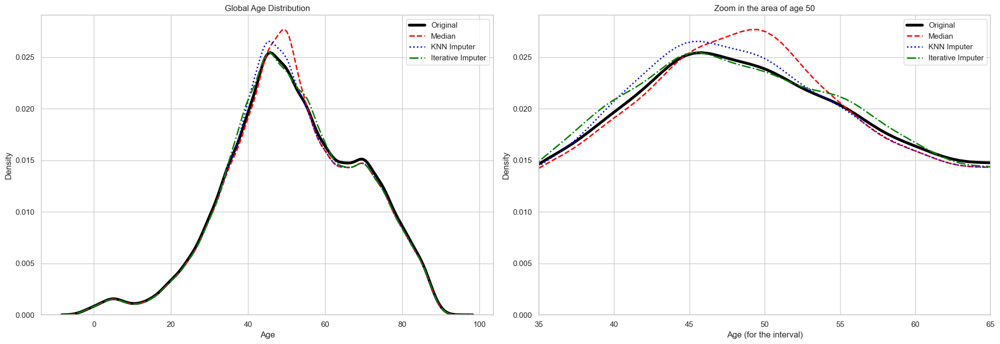

In [30]:
sns.set_theme(style="whitegrid")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

plot_params = [
    (bench_df['age'].dropna(), 'Original', 'black', 4, '-'),
    (bench_df['age_median'], 'Median', 'red', 2, '--'),
    (bench_df['age_knn'], 'KNN Imputer', 'blue', 2, ':'),
    (bench_df['age_iterative'], 'Iterative Imputer', 'green', 2, '-.')
]

for data, label, color, width, style in plot_params:
    sns.kdeplot(data, label=label, color=color, lw=width, ls=style, ax=ax1)
    sns.kdeplot(data, label=label, color=color, lw=width, ls=style, ax=ax2)

# graph 1: complete view
ax1.set_title('Global Age Distribution')
ax1.set_xlabel('Age')
ax1.legend()

# graph 2: zoom in the max
median = bench_df['age'].median()
ax2.set_xlim(median - 15, median + 15)
ax2.set_title(f'Zoom in the area of age {int(median)}')
ax2.set_xlabel('Age (for the interval)')
ax2.legend()

plt.tight_layout()
plt.show()

**REVER !!!**
This analysis confirms that the Iterative Imputer is the best strategy for this dataset. While Median imputation introduces a significant artificial spike that distorts the natural age distribution, the Iterative method closely represents the original curve. By preserving the statistical variance and population density, this approach prevents the neural network from learning biased patterns during training. Therefore, the **Iterative Imputer** is chosen as the final method to ensure high data integrity.

### 3.1.3 Imputation Implementation

In [31]:
# Fit on train only
it_imputer = IterativeImputer(random_state=42, max_iter=10)
it_imputer.fit(train_ohe)

,estimator,None
,missing_values,nan
,sample_posterior,False
,max_iter,10
,tol,0.001
,n_nearest_features,None
,initial_strategy,'mean'
,fill_value,None
,imputation_order,'ascending'
,skip_complete,False
,min_value,-inf


In [32]:
# Apply to all splits
train_df = train_df.copy()
val_df = val_df.copy()
test_df = test_df.copy()

In [33]:
train_df['age'] = it_imputer.transform(train_ohe)[:, 0]
val_df['age'] = it_imputer.transform(val_ohe)[:, 0]
test_df['age'] = it_imputer.transform(test_ohe)[:, 0]

In [34]:
print(f"Age nulls after imputation — Train: {train_df['age'].isnull().sum()}, "
      f"Val: {val_df['age'].isnull().sum()}, Test: {test_df['age'].isnull().sum()}")

Age nulls after imputation — Train: 0, Val: 0, Test: 0


With this implementation, the dataset achieves 100% completion and provides a high quality base for the subsequent pre processing stages.

## 3.2 Image Cleaning

This section focuses on identifying and treating technical anomalies in the dataset.
In the context of medical imaging, we considered that clinical outliers (rare or atypical lesions) should be completely preserved, as they are the core of the study. Therefore, the focus will be on technical outliers, since they can degrade model performance and should be flagged for review.

### 3.2.1 Brightness and Contrast

Images with extreme pixel‑intensity statistics using the 1st and 99th percentiles:
  - High brightness outliers - images that are overexposed
  - Low brightness outliers - images that are underexposed
  - Low contrast outliers - images lacking texture information

In [ ]:
merged_df['img_mean'] = img_stats_df['img_mean']
merged_df['img_std'] = img_stats_df['img_std']

# thresholds
bright_thr = merged_df["img_mean"].quantile(0.99)
dark_thr = merged_df["img_mean"].quantile(0.01)
low_contrast_thr = merged_df["img_std"].quantile(0.01)

# subsets
outliers_bright = merged_df[merged_df["img_mean"] > bright_thr]
outliers_dark = merged_df[merged_df["img_mean"] < dark_thr]
outliers_low_contrast = merged_df[merged_df["img_std"] < low_contrast_thr]

print(len(outliers_bright), "bright outliers")
print(len(outliers_dark), "dark outliers")
print(len(outliers_low_contrast), "low contrast outliers")

115 bright outliers
115 dark outliers
115 low contrast outliers


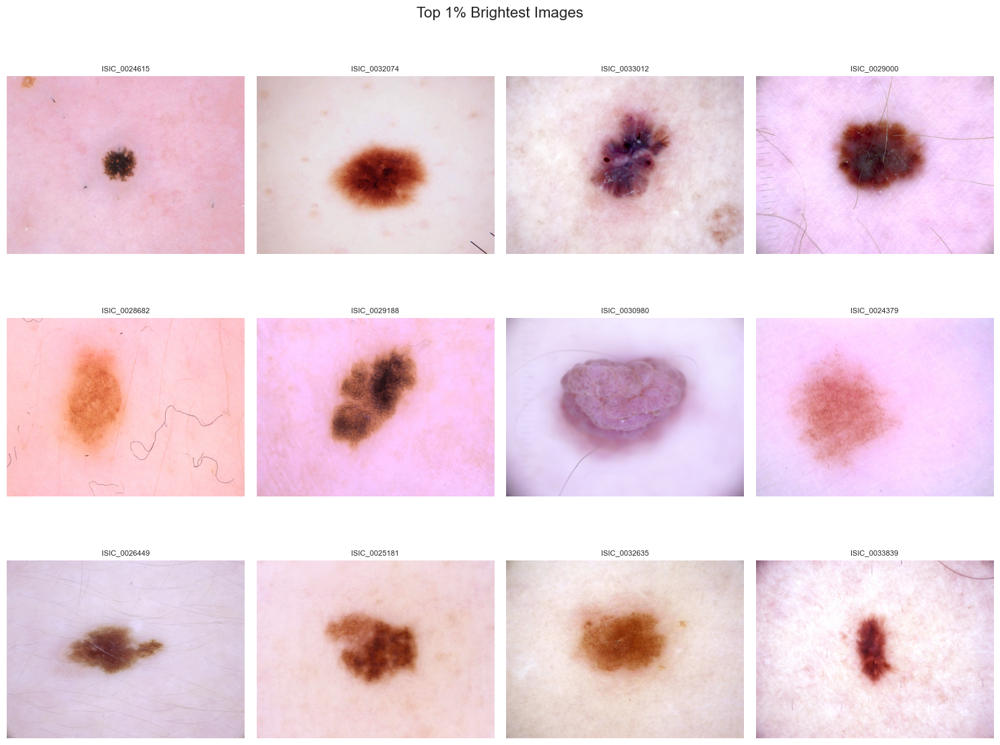

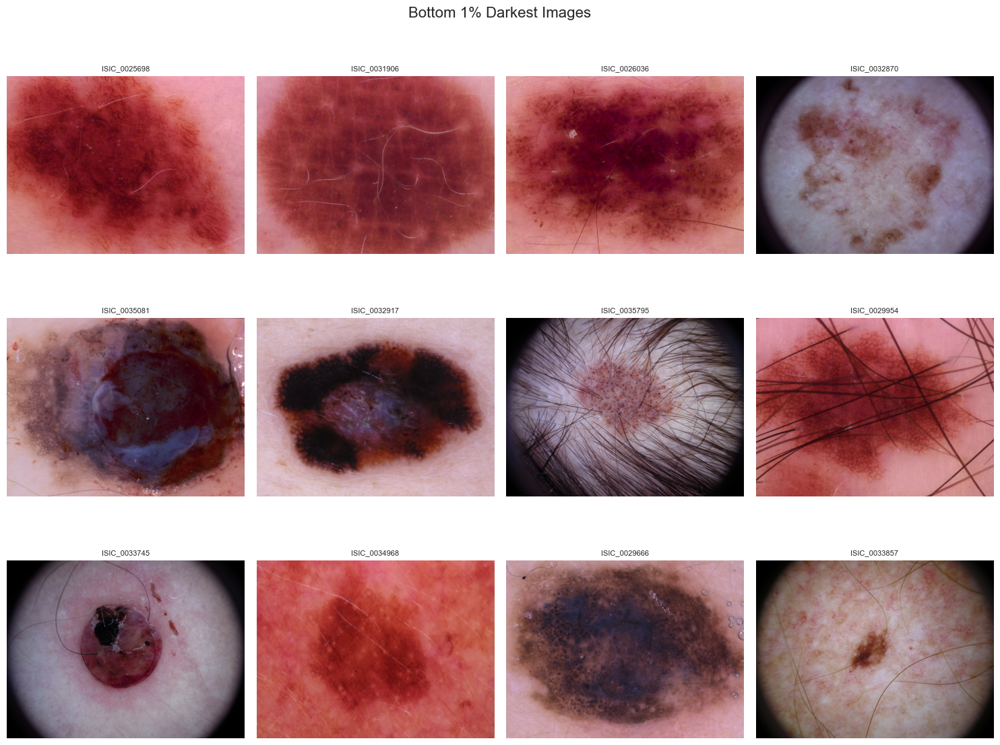

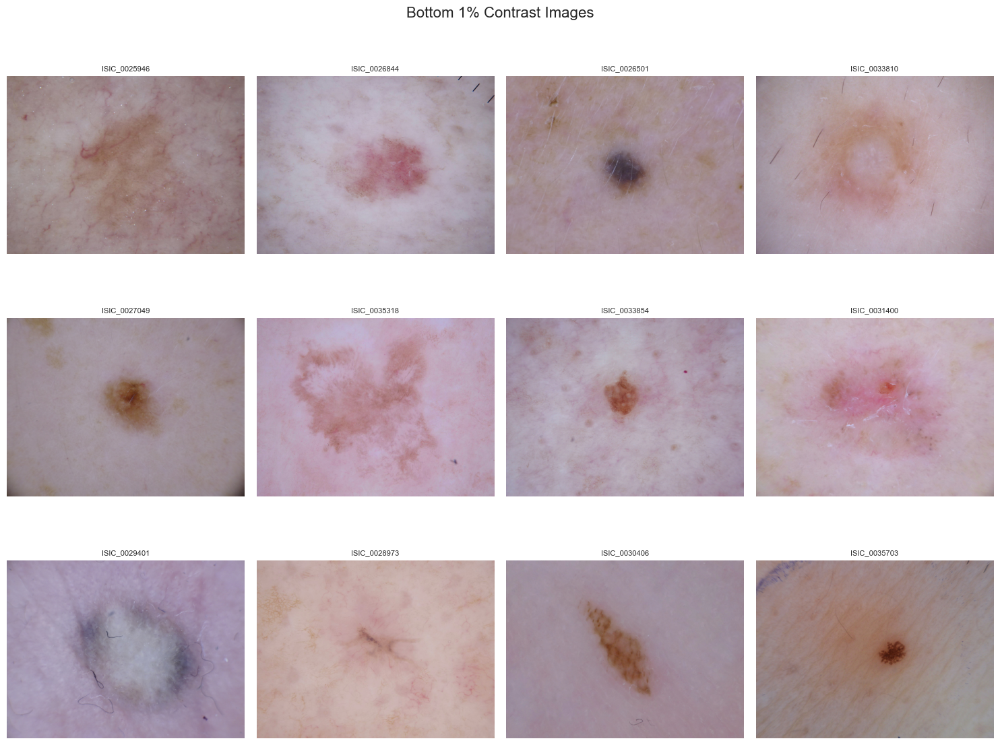

In [ ]:
show_images(outliers_bright, "Top 1% Brightest Images")
show_images(outliers_dark, "Bottom 1% Darkest Images")
show_images(outliers_low_contrast, "Bottom 1% Contrast Images")

Visual inspection of the statistical outliers based on pixel intensity quantiles revealed critical acquisition patterns that could impact model generalization:

- High Brightness (Overexposure): The top 1% brightest images frequently exhibit "washed-out" skin tones possibly caused by aggressive flash photography and/or naturally lighter skin tones.

- Low Brightness & Vignetting: Some skin lesions have typically darker tones, nevertheless, a few darkest outliers suffer from significant vignetting (radial darkening) and/or body hair. This optical artifact skews the global intensity mean and risks introducing a "shortcut" where the model might incorrectly associate dark borders with specific pathological classes.

**Technical Implications:** While both cases could impact the model, the lesion morphology remains largely visible, meaning we shouldn't remove them. These findings justify the implementation of **Illumination Normalization (CLAHE)** to standardize the illumination profile across the dataset. Additionally, **background removal** could aid by isolating the lesion from vignetting artifacts and non-diagnostic skin regions, reducing spurious correlations between border darkness and pathological classes. Both techniques should be considered for dataset preparation to improve model generalization.


### 3.2.2. Semantic Outliers via UMAP Embeddings

  - Extract deep embeddings using a pretrained ResNet18
  - Project them into 2D space using UMAP
  - Compute each image’s distance to the embedding centroid
  - Flag the top 1% most distant samples

In [ ]:
# Extract embeddings for training set only
embed_model = models.resnet18(pretrained=True)
embed_model = torch.nn.Sequential(*list(embed_model.children())[:-1])
embed_model.eval()

transform = T.Compose([T.Resize((224, 224)), T.ToTensor()])

def extract_embeddings(df):
    embs = []
    for path in tqdm(df["image_path"], desc="Extracting embeddings"):
        img = Image.open(path).convert("RGB")
        x = transform(img).unsqueeze(0)
        with torch.no_grad():
            emb = embed_model(x).squeeze().numpy()
        embs.append(emb)
    return np.array(embs)

train_embeddings = extract_embeddings(train_df)
val_embeddings   = extract_embeddings(val_df)
test_embeddings  = extract_embeddings(test_df)

C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Extracting embeddings: 100%|██████████| 999/999 [00:57<00:00, 17.37it/s]


In [ ]:
# Fit UMAP on training embeddings only
train_reducer = umap.UMAP(random_state=42)
train_embedding_2d = train_reducer.fit_transform(train_embeddings)

# Transform val and test using the fitted reducer (no refit)
val_embedding_2d  = train_reducer.transform(val_embeddings)
test_embedding_2d = train_reducer.transform(test_embeddings)

c:\Users\tomas\anaconda3\envs\clean_ml\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP distance threshold (train 99th pct): 6.9542
Train: 80 UMAP outliers
Val: 10 UMAP outliers
Test: 9 UMAP outliers


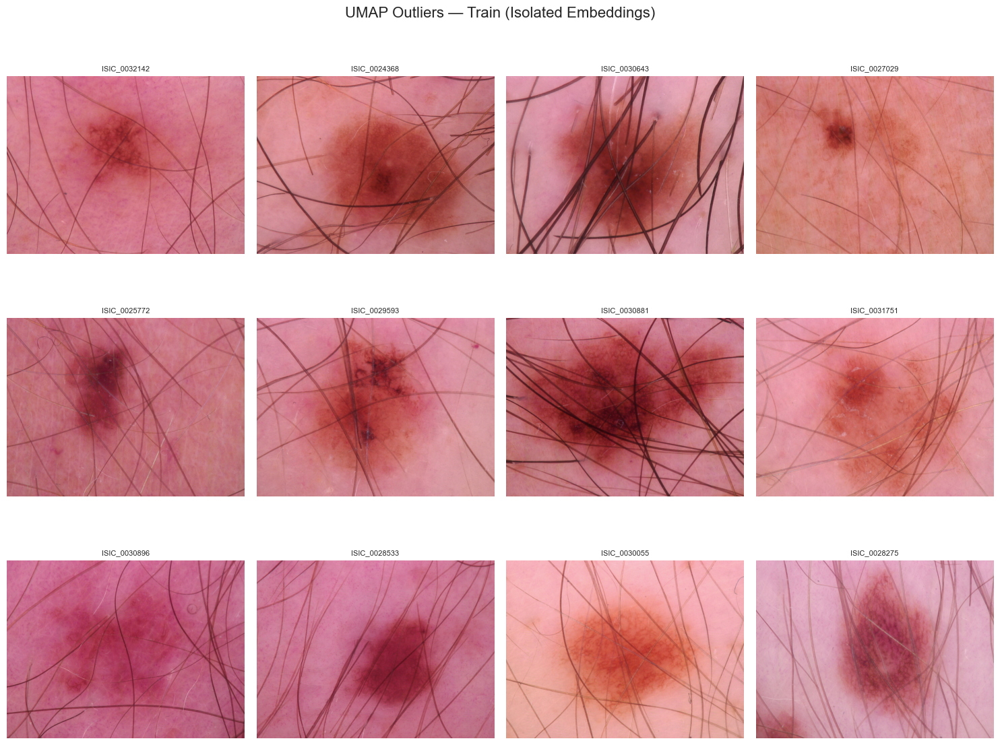

In [ ]:
# Centroid and threshold computed on training set only
train_centroid = train_embedding_2d.mean(axis=0)
train_distances = pairwise_distances(train_embedding_2d, train_centroid.reshape(1, -1)).flatten()
umap_thr = np.quantile(train_distances, 0.99)

train_df = train_df.copy()
val_df   = val_df.copy()
test_df  = test_df.copy()

train_df["umap_dist"] = train_distances
val_df["umap_dist"]   = pairwise_distances(val_embedding_2d,  train_centroid.reshape(1, -1)).flatten()
test_df["umap_dist"]  = pairwise_distances(test_embedding_2d, train_centroid.reshape(1, -1)).flatten()

print(f"UMAP distance threshold (train 99th pct): {umap_thr:.4f}")
for name, df in [("Train", train_df), ("Val", val_df), ("Test", test_df)]:
    print(f"{name}: {(df['umap_dist'] > umap_thr).sum()} UMAP outliers")

outliers_umap_train = train_df[train_df["umap_dist"] > umap_thr]
show_images(outliers_umap_train, "UMAP Outliers — Train (Isolated Embeddings)")

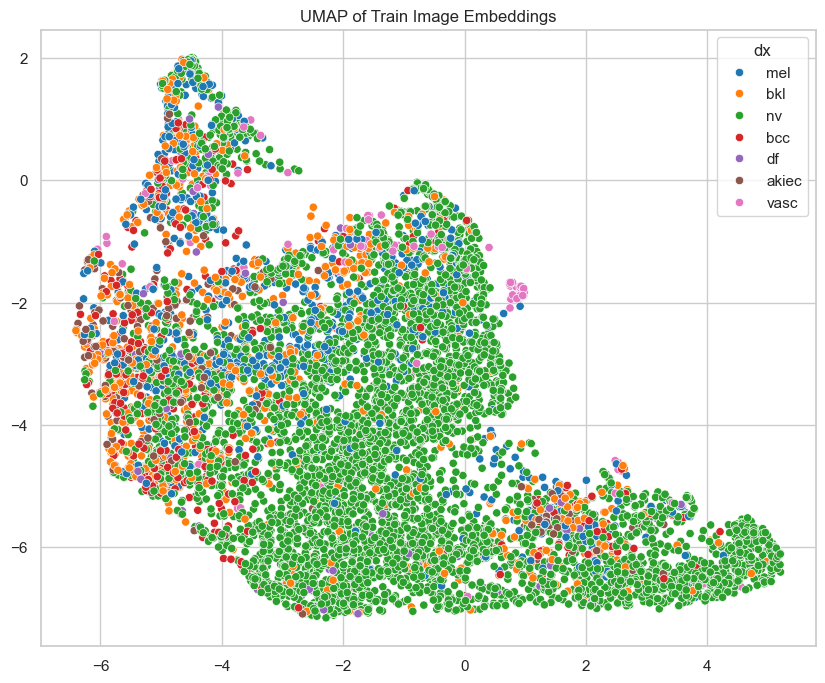

In [ ]:
# UMAP plot coloured by diagnosis
plt.figure(figsize=(10, 8))
sns.scatterplot(x=train_embedding_2d[:, 0], y=train_embedding_2d[:, 1],
                hue=train_df["dx"], palette="tab10")
plt.title("UMAP of Train Image Embeddings")
plt.show()

The UMAP dimensional projection successfully isolated a cluster of images whose distance from the embedding centroid is significantly higher than the dataset average. Analysis of these samples reveals a dominant confounding factor:

- Occlusion by Body Hair: Nearly 100% of the identified UMAP outliers display a high density of terminal hair overlying the lesion. The presence of high-contrast, dark linear structures creates a digital signature that "drowns out" the underlying morphological features. The fact that UMAP isolates these images proves that hair is not merely visual noise, but a structural feature that fundamentally shifts the latent distribution of the data.

**Mitigation Strategy**: To prevent the Deep Learning model from learning non-biological artifacts, a Hair Removal pipeline (e.g., DullRazor) is required. This step ensures the CNN focuses on dermatological patterns rather than occlusion artifacts.

In [ ]:
# Flag outliers in all splits (using train-derived thresholds)
for df in [train_df, val_df, test_df]:
    df["is_outlier"] = (
        (df["img_mean"] > bright_thr) |
        (df["img_mean"] < dark_thr)   |
        (df["img_std"]  < low_contrast_thr) |
        (df["umap_dist"] > umap_thr)
    )

for name, df in [("Train", train_df), ("Val", val_df), ("Test", test_df)]:
    print(f"{name} outliers flagged: {df['is_outlier'].sum()}")

Train outliers flagged: 316
Val outliers flagged: 34
Test outliers flagged: 34


### 3.2.3 Cleaning Pipeline

To ensure the Deep Learning model learns dermatological features rather than photographic characteristics, we apply a three-step cleaning process.

1. **Hair Removal (DullRazor Algorithm)** *(Applied in all images)*
<br>Since hairs are high-contrast linear occlusions, we use the DullRazor approach:
    - Morphological Blackhat Filtering: Isolate dark, thin structures from the background.
    - Binary Masking: Create a precise map of every hair strand.
    - Telea Inpainting: Replace the "hair pixels" with a smooth interpolation of the surrounding skin texture.

2. **Illumination Normalization (CLAHE)** *(Tested in preprocessing pipeline)*
<br>To handle Overexposure and Low Contrast:
    - We convert the image to the CIE Lab color space.
    - We apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to the L (Luminance) channel.
    - CLAHE enhances local contrast in small tiles, bringing back "washed out" details in bright areas without amplifying noise.

3. **Background Removal (Lesion Segmentation)** *(Tested in preprocessing pipeline)*
<br>To remove non-diagnostic skin and focus model attention on the lesion:
    - We convert the image to LAB color space and apply Otsu thresholding on the L (Luminance) channel to isolate the lesion.
    - Morphological closing with an elliptical kernel removes small holes and noise in the mask.
    - Connected components analysis removes artifacts, keeping only the largest lesion region.
    - The background is replaced with white, preserving only the lesion.

As stated, the DullRazor algorithm will be right away applied to all images, while the remaining methods will be further tested in a pipeline:

In [35]:
# Process each split independently
processed_base = os.path.join(base_path, "HAM10000_razed")

train_df = clean_and_save_images(train_df, os.path.join(processed_base, "train"))
val_df = clean_and_save_images(val_df, os.path.join(processed_base, "val"))
test_df = clean_and_save_images(test_df, os.path.join(processed_base, "test"))

Cleaning → ./data\HAM10000_razed\test: 100%|██████████| 1126/1126 [00:40<00:00, 27.55it/s]


In [36]:
verify_remediation(train_df, threshold=umap_thr)

NameError: name 'umap_thr' is not defined

## 3.3 Label Encoding

In [37]:
label2idx = {label: i for i, label in enumerate(sorted(train_df["dx"].unique()))}
idx2label = {i: label for label, i in label2idx.items()}

train_df["dx_encoded"] = train_df["dx"].map(label2idx)
val_df["dx_encoded"] = val_df["dx"].map(label2idx)
test_df["dx_encoded"] = test_df["dx"].map(label2idx)

In [38]:
# Exporting the label encoding dict
with open("label2idx.json", "w") as f:
    json.dump(label2idx, f)

## 3.4 Resizing

**Dataset Uniformity**

A significant advantage in our preprocessing phase is that all original images in our dataset share a uniform resolution of `600x450` pixels (a `4:3` aspect ratio). This consistency considerably simplifies our pipeline, as it removes the need to dynamically handle variable baseline shapes before applying transformations.

**The Modeling Standard**

In standard transfer learning pipelines, it is common practice to resize inputs to a rigid `224x224` square. This standard originates from the ImageNet dataset, upon which most foundational pre-trained models were trained. Because the internal convolutional filters of these networks were mathematically optimized to recognize textures and features at this specific `224` pixel scale, mimicking this resolution is generally recommended to maximize feature extraction.

**Our Pipeline Approach**

However, forcing a `600x450` clinical image into a rigid square induces spatial distortion, artificially warping the geometric symmetry of the lesions. While most standard models expect square images, removing the classifier head (e.g., using `include_top=False`) and applying Global Average Pooling allows the pretrained convolutional base to process non-square, rectangular inputs without error.

To systematically determine which approach yields the highest classification accuracy, our pipeline evaluates five distinct resizing configurations:

1. Standard Square (Deformation): Forcing the image to `224x224`. This retains all lesion margins but distorts biological symmetry.

2. Padded Square: Scaling the long edge to `224` and padding the remainder to create a `224x224` square. This preserves exact geometry and margins but introduces artificial border artifacts.

3. Center Crop Square: Scaling the short edge to `224` and extracting the central `224x224` region. This maintains geometry but risks trimming peripheral lesion boundaries.

4. Short-Edge Rectangle: Scaling the short edge to `224` while maintaining the native `4:3` aspect ratio, resulting in a `300x224` input.

5. Area-Matched Rectangle: Scaling the image to maintain its native `4:3` ratio while matching the total pixel area of the ImageNet standard (roughly `50,176` total pixels). By resizing to exactly `256x192`, we preserve natural symmetry while ensuring the physical size of the lesion features remains perfectly scaled for the pretrained filters.

**Visualizations of Resized Images**

To better understand the geometric trade-offs of these techniques prior to modeling, visual representations of a sample image subjected to all five formatting strategies are provided below.

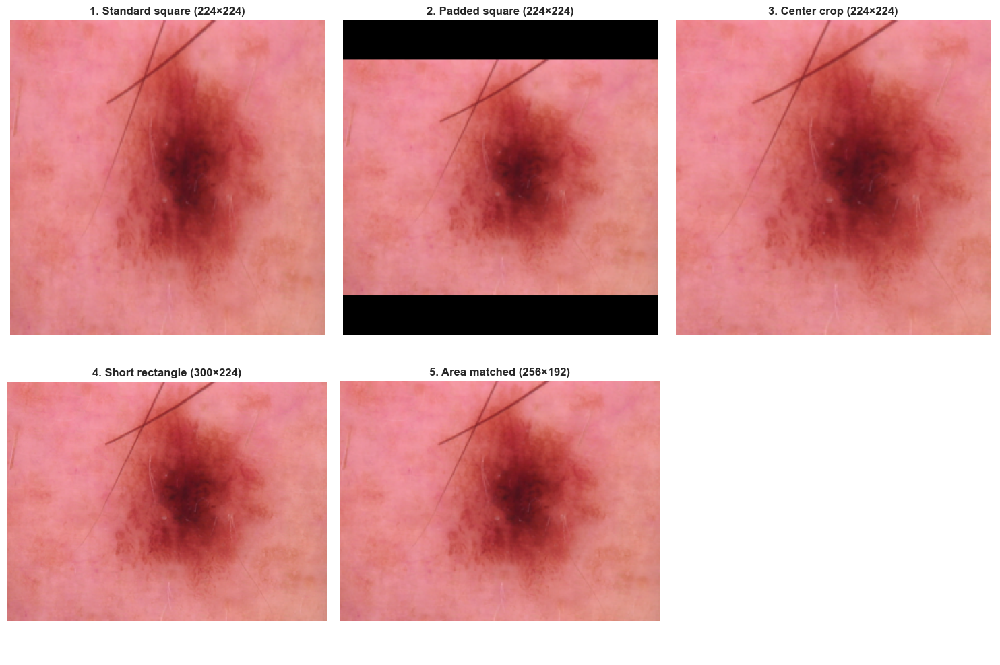

In [ ]:
sample_img = Image.open(train_df['image_path'].iloc[0])

# Apply all formats
formats = {
    '1. Standard square (224×224)': format_standard_square(img),
    '2. Padded square (224×224)': format_padded_square(img),
    '3. Center crop (224×224)': format_center_crop(img),
    '4. Short rectangle (300×224)': format_short_rectangle(img),
    '5. Area matched (256×192)': format_area_matched(img)
}

# Display all in a grid
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, (title, formatted_img) in enumerate(formats.items()):
    formatted_img = cv2.cvtColor(formatted_img, cv2.COLOR_BGR2RGB)
    ax = axes[idx]
    ax.imshow(formatted_img)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.axis('off')

# Hide the extra subplot
axes[5].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
def process_image_pipeline(image_path, methods_to_run=None):
    """
    Applies selected transformations to a single image.

    Args:
        image_path (str): Path to the source image file.
        methods_to_run (list, optional): List of method names to execute. 
                                        Runs all if None.
    Returns:
        dict: Processed images mapped by method name, or None on failure.
    """
    methods = {
        'standard_square': format_standard_square,
        'padded_square': format_padded_square,
        'center_crop': format_center_crop,
        'short_rectangle': format_short_rectangle,
        'area_matched': format_area_matched
    }
    
    # Filter methods to run
    active = {k: v for k, v in methods.items() if k in methods_to_run} if methods_to_run else methods

    try:
        # 'with' ensures the file is closed automatically
        with Image.open(image_path) as img:
            # Execute methods via dictionary comprehension
            return {name: func(img) for name, func in active.items()}
    except Exception as e:
        print(f"Error: {e}")
        return None

In [ ]:
# =====================================================================
# PIPELINE USAGE GUIDE (Save for Modeling Phase)
# =====================================================================

# --- 1. HOW TO TEST A SINGLE IMAGE ---
# To test the pipeline on the very first image in your dataset:
# test_outputs = process_image_pipeline(all_images[0])
# test_outputs['area_matched']  # Place this on the last line of a cell to view it


# --- 2. HOW TO TRANSFORM ALL 10,000 IMAGES "ON-THE-FLY" FOR TRAINING ---
# Do not use a 'for' loop. Plug the pipeline into your DataLoader structure.
# Here is the blueprint for how it works (using PyTorch as an example):

# class LesionDataset():
#     def __init__(self, image_path_list, target_format='area_matched'):
#         self.image_paths = image_path_list
#         self.target_format = target_format
#
#     def __getitem__(self, index):
#         # 1. The model asks for an image by its index (e.g., index 405)
#         img_path = self.image_paths[index]
#         
#         # 2. Run our pipeline function, asking ONLY for the format we are testing
#         results = process_image_pipeline(img_path, methods_to_run=[self.target_format])
#         
#         # 3. Extract that specific image from the dictionary
#         final_image = results[self.target_format]
#         
#         # 4. (You would convert final_image to a tensor here, then return it)
#         return final_image

In [ ]:
outputs = process_image_pipeline(all_images[0], methods_to_run="format_padded_square")
print(outputs)

# more than one image
three_images = all_images[0:3]
batch_results = []
for img_path in three_images:
    outputs = process_image_pipeline(img_path)
    batch_results.append(outputs)

batch_results[0] # is the dictionary for your FIRST image.
batch_results[0]["padded_square"]

# **4. Final Pipeline Strategy**

## Resizing

Resizing (5 strategies): Core → test all
Phase 1: Test 5 resizing strategies on a baseline model (no CLAHE, no BG removal). Pick the winner.

In [104]:
from itertools import product
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from keras.applications.resnet import preprocess_input

In [42]:
train_train_df, train_val_df = create_dl_splits(train_df, val_frac=0.2, test=False)

N_CLASSES = 7

X_train = train_train_df.image_path
y_train = to_categorical(train_train_df.dx_encoded, num_classes=N_CLASSES)

X_val = train_val_df.image_path
y_val = to_categorical(train_val_df.dx_encoded, num_classes=N_CLASSES)

Total images: 9214
Train: 6436 images | 4861 unique lesions
Val:   2778 images | 2084 unique lesions
Leakage check passed! No overlapping lesions.



In [102]:
def create_data_pipeline(
    df,
    batch_size=32,
    resize_function=format_standard_square,
    clahe=False,
    bg_removal=False,
    augment=True,
    shuffle=True
):
    """
    TensorFlow data pipeline with preprocessing.
    Returns: tf.data.Dataset
    """
    
    # Extract image paths and labels
    image_paths = df['image_path'].values
    labels = df['dx_encoded'].values
    
    def load_and_preprocess(path, label):
        """Load image and apply preprocessing pipeline."""
        # Read image
        img = tf.io.read_file(path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.cast(img, tf.float32)
        
        img = resize_function(img)
        
        # Apply CLAHE
        if clahe:
            img = fix_illumination(img)
        
        # Apply background removal
        if bg_removal:
            img = remove_background(img)
        
        # Normalize (ImageNet stats for transfer learning)
        img = img / 255.0
        img = (img - tf.constant(means)) / \
              tf.constant(stds)
        
        return img, label
    
    # Create dataset
    make_dataset

    dataset = tf.data.Dataset.from_tensor_slices((
        image_paths.astype(str),
        labels.astype(np.int32)
    ))
    
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(df))
    
    dataset = dataset.map(
        load_and_preprocess,
        num_parallel_calls=tf.data.AUTOTUNE
    )
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

In [100]:
def build_preproc_model(input_shape=(224, 224, 3)):
    base_model = ResNet50(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )
    base_model.trainable = False

    inputs = keras.Input(shape=input_shape)
    x = base_model(inputs, training=False)
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dense(128, activation='relu')(x)
    x = keras.layers.Dropout(0.3)(x)
    outputs = keras.layers.Dense(N_CLASSES, activation='softmax')(x)

    return keras.Model(inputs, outputs)

In [101]:
def compile_model(model, num_classes=7):
    """Compile with class weights to handle imbalance."""
    
    # Calculate class weights (inverse frequency)
    # nv dominates at 66% → weight ≈ 0.15
    # rare classes (vasc, df) at ~1.5% → weight ≈ 6.0
    class_weights = make_class_weights(train_train_df)
    
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model, class_weights

In [103]:
shape_map = {
    format_standard_square: (224, 224),
    format_padded_square:   (224, 224),
    format_center_crop:     (224, 224),
}

def train_loop(train_df, val_df, epochs=10, batch_size=32, resizing=format_standard_square, verbose=1):
    print(f"\n{'='*60}")
    print(f"Training with resizing={resizing.__name__}")
    print(f"{'='*60}\n")

    h, w = shape_map[resizing]

    train_dataset = make_dataset(train_df, output_shape=(h, w),
                                 shuffle=True, repeat=True, batch_size=batch_size)
    val_dataset   = make_dataset(val_df, output_shape=(h, w), batch_size=batch_size)

    model = build_preproc_model(input_shape=(h, w, 3))
    model, class_weights = compile_model(model)

    early_stop = keras.callbacks.EarlyStopping(
        monitor='val_accuracy', patience=3,
        restore_best_weights=True, verbose=0
    )
    reduce_lr = keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5,
        patience=2, min_lr=1e-7, verbose=0
    )

    history = model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=epochs,
        steps_per_epoch=len(train_df) // batch_size,
        class_weight=class_weights,
        callbacks=[early_stop, reduce_lr],
        verbose=verbose
    )

    best_val_accuracy = max(history.history['val_accuracy'])
    print(f"\n✓ Best validation accuracy: {best_val_accuracy:.4f}")
    return best_val_accuracy, model, history

In [105]:
IMAGENET_MEAN = tf.constant([0.485, 0.456, 0.406])
IMAGENET_STD  = tf.constant([0.229, 0.224, 0.225])

def load_image_with_resize(path, label, output_shape=(224, 224)):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, output_shape)   # still [0, 255] float
    img = preprocess_input(img)                # ResNet50-specific normalisation
    return img, label

def make_dataset(df, output_shape=(224, 224), shuffle=False, repeat=False, batch_size=32):
    paths  = df["image_path"].values
    labels = df["dx_encoded"].values

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(
        lambda x, y: load_image_with_resize(x, y, output_shape),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    if shuffle:
        ds = ds.shuffle(buffer_size=len(df))
    if repeat:
        ds = ds.repeat()
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

In [78]:
import tensorflow as tf

gpus = tf.config.list_physical_devices('GPU')
print("GPUs available:", gpus)
print("TF built with CUDA:", tf.test.is_built_with_cuda())
print("GPU available to TF:", tf.test.is_gpu_available())  # deprecated but still works

GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TF built with CUDA: True
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU available to TF: True


In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    tf.config.experimental.set_memory_growth(gpus[0], True)

In [93]:
for df in [train_train_df, train_val_df]:
    df['image_path'] = df['cleaned_path']

In [108]:
print(train_train_df['image_path'].iloc[0])

./data\HAM10000_razed\train\ISIC_0024306_cleaned.jpg


In [ ]:
resizing_strategies = [format_standard_square, format_padded_square, format_center_crop] #format_short_rectangle, format_area_matched]

results = []
best_resizing = None
best_acc = 0

print("PHASE 1: Testing resizing strategies")
print("-" * 60)

for strategy in resizing_strategies:
    val_acc, model, history = train_loop(
        train_train_df,
        train_val_df,
        epochs=10,
        batch_size=128,
        resizing=strategy,
        verbose=1  # Silent for cleaner output
    )
    
    results.append({
        'strategy': strategy.__name__,
        'val_accuracy': val_acc,
        'phase': 1
    })
    
    if val_acc > best_acc:
        best_acc = val_acc
        best_resizing = strategy
        
    print(f"{strategy.__name__:30s} → {val_acc:.4f}")

print(f"\n✓ Best resizing: {best_resizing.__name__} ({best_acc:.4f})\n")

PHASE 1: Testing resizing strategies
------------------------------------------------------------

Training with resizing=format_standard_square

Epoch 1/10
50/50 [==============================] - 44s 567ms/step - loss: 2.2013 - accuracy: 0.2172 - val_loss: 1.5386 - val_accuracy: 0.4356 - lr: 1.0000e-04
Epoch 2/10
50/50 [==============================] - 28s 575ms/step - loss: 1.5415 - accuracy: 0.4280 - val_loss: 1.3433 - val_accuracy: 0.5216 - lr: 1.0000e-04
Epoch 3/10
50/50 [==============================] - 31s 626ms/step - loss: 1.3602 - accuracy: 0.4992 - val_loss: 1.2850 - val_accuracy: 0.5403 - lr: 1.0000e-04
Epoch 4/10
50/50 [==============================] - 38s 775ms/step - loss: 1.2367 - accuracy: 0.5303 - val_loss: 1.2010 - val_accuracy: 0.5637 - lr: 1.0000e-04
Epoch 5/10
50/50 [==============================] - 45s 901ms/step - loss: 1.1419 - accuracy: 0.5609 - val_loss: 1.1603 - val_accuracy: 0.5810 - lr: 1.0000e-04
Epoch 6/10
50/50 [==============================] - 49

## CLAHE and Background

# 5 Export Final Splits

In [75]:
train_df.to_csv(os.path.join(base_path, "train_split.csv"), index=False)
val_df.to_csv(  os.path.join(base_path, "val_split.csv"),   index=False)
test_df.to_csv( os.path.join(base_path, "test_split.csv"),  index=False)

print("All splits saved. Pipeline complete.")
print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")

All splits saved. Pipeline complete.
Train: 7976 | Val: 1037 | Test: 999
